**Table of Contents** <br>
* [1. Import libraries and datasets](#import)

* [2. Initial Exploration](#initialexploration)

* [3. Coherence Checking](#Coherence)

* [4. Split data](#Split)

* [5. Outliers Treatment](#outliers)
    * [5.1. Manual Limitation](#AutomaticLimitation)
    * [5.2. IQR](#IQR)
    * [5.3. 2-dimensional outliers](#2dim_outliers)

* [6. Missing values Treatment](#missings)

* [7. Scale the data](#scale)

* [8. Feature Engeneering](#FeatureEngeneering)

* [9. Redo outliers check](#redo-outliers)

* [10. Feature Selection](#FeatureSelection)
    * [10.1. Univariate Analysis](#univariate)
    * [10.2. Filter Methods](#filter)
        * [10.2.1 Correlation Matrix](#correlation)
        * [10.2.2 Chi-Squared](#chi-squared)
        * [10.2.3 ANOVA](#ANOVA)
    * [10.3. Wrapper methods](#warpper)
        * [10.3.1 RFE](#RFE)
        * [10.3.2 Forward Sequential Feature Selection](#forward)
        * [10.3.3 Backward Sequential Feature Selection](#backward)
    * [10.4. Embedded methods](#embedded)
        * [10.4.1 Ridge Regression](#ridge)
        * [10.4.2 Decision Tree for feature importance](#decision_tree_sel_feature)
        
* [11. Check for an imbalanced dataset](#imbalanced)
    * [11.1.  Adaptive Syntetic Oversampling](#Adaptive)
    
* [12. Modeling](#Modeling)
    * [12.1 Decision trees](#DT)
    * [12.2 Neural Network](#NN)
    * [12.3 Logistic Regression](#LR)
    * [12.4 KNN](#KNN)
    * [12.5 Support Vector Machine](#SVM)
    * [12.6 Ensemble models](#ENSEMBLE)
        * [12.6.1 Random Forest](#RF)
        * [12.6.2 Adaboost](#Adaboost)
        * [12.6.3 Gradiente Boosting](#GB)
        * [12.6.4 Voting Classifier](#VC)
        * [12.6.5 Stacking Classifier](#Stacking)
            * [12.6.5.1 Final Model](#Final)
        
[13. Model Comparison](#Model_comparison)

<hr>
<a class="anchor" id="import">
    
# 1. Import libraries and datasets
    
</a>

In [180]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import datetime as dt
from matplotlib import pyplot
import seaborn as sns
import os

from math import ceil

from numpy import mean,std
from numpy import arange
import matplotlib.pyplot as plt


from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from collections import OrderedDict

from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import SMOTENC

from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn.feature_selection import f_classif
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import f1_score, make_scorer
from sklearn.metrics import auc
from sklearn.metrics import roc_curve,precision_recall_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

%config InlineBackend.figure_format = 'retina' 

In [181]:
import warnings
warnings.filterwarnings('ignore')

In [182]:
!pip install imblearn
!pip install metrics
!pip install collections
!pip install scipy
!pip install os
!pip install seaborn

ERROR: Could not find a version that satisfies the requirement collections (from versions: none)
ERROR: No matching distribution found for collections


ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os


In [183]:
df = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

<hr>
<a class="anchor" id="initialexploration">
    
# 2. Initial Exploration
    
</a>

In [184]:
df.head()

,Access_ID,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy
0,102863333,21-Mar-20,0,0.0,0,0.0,3,64.0000,0.0000,0.0667,0.0000,MacOSX,2,Portugal,1,Returner,0
1,103117814,20-May-20,0,0.0,0,0.0,23,684.5000,0.0217,0.0449,0.0000,Windows,2,France,6,Returner,0
2,103201891,4-Dec-20,0,0.0,0,0.0,8,95.0000,0.0250,0.0583,0.0000,Windows,4,Italy,1,Returner,0
3,103226087,22-Dec-20,0,0.0,0,0.0,9,608.7500,0.0000,0.0250,42.4225,Windows,2,United Kingdom,2,Returner,1
4,103234445,24-Nov-20,0,0.0,2,386.0,36,1609.9397,0.0000,0.0093,12.5033,Windows,2,Spain,3,Returner,1


In [185]:
df.describe()

,Access_ID,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Browser,Type_of_Traffic,Buy
count,9.999000e+03,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000
mean,4.519728e+08,2.324232,81.205854,0.508051,34.559101,31.685869,1199.769430,0.022305,0.043181,5.963120,2.352535,3.957496,0.155216
std,2.024990e+08,3.340676,179.715545,1.279390,139.796989,44.550277,1958.276304,0.048776,0.048845,18.753626,1.715698,3.675159,0.362128
min,1.028633e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,2.731950e+08,0.000000,0.000000,0.000000,0.000000,7.000000,183.562500,0.000000,0.014300,0.000000,2.000000,2.000000,0.000000
50%,4.536169e+08,1.000000,7.500000,0.000000,0.000000,18.000000,599.000000,0.003200,0.025100,0.000000,2.000000,2.000000,0.000000
75%,6.259756e+08,4.000000,92.208350,0.000000,0.000000,38.000000,1470.270800,0.016800,0.050000,0.000000,2.000000,4.000000,0.000000
max,7.984440e+08,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522200,0.200000,0.200000,361.763700,13.000000,15.000000,1.000000


<AxesSubplot:>

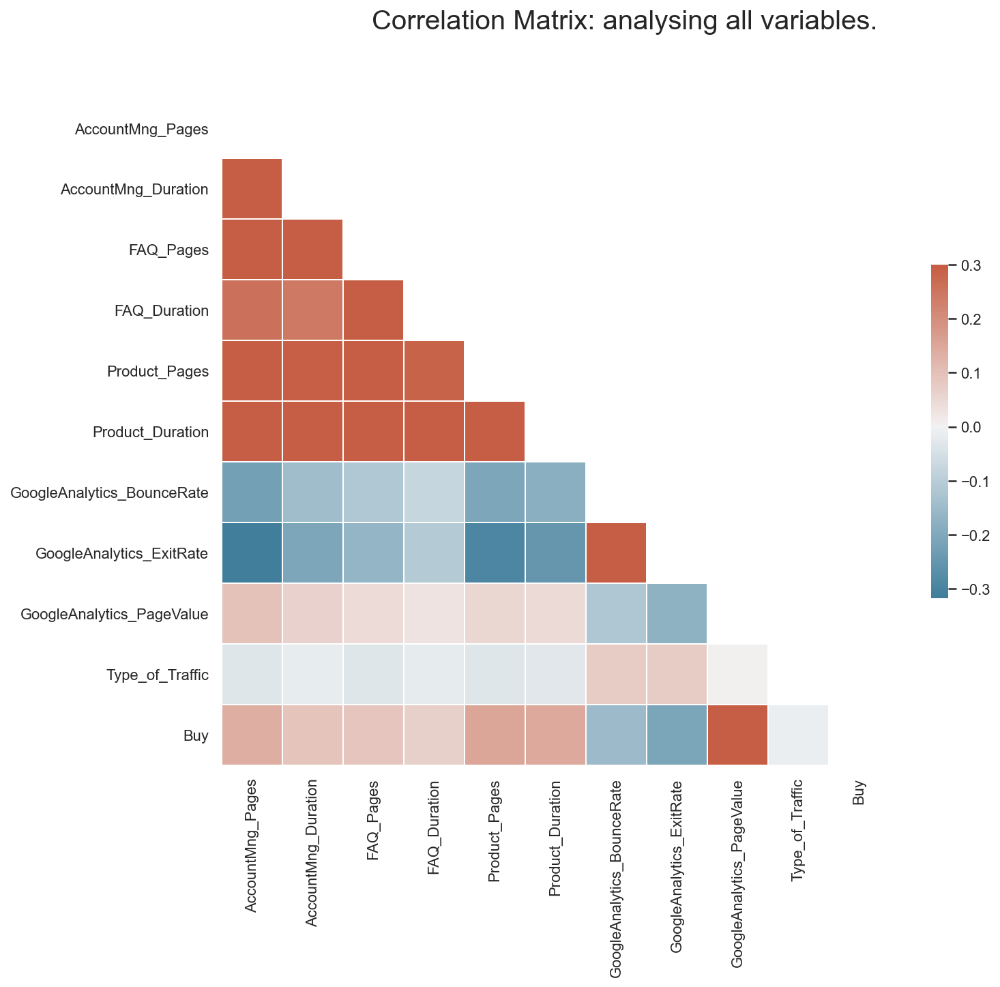

In [186]:
# sns.set_theme(style="white")
# %matplotlib inline

# rs = np.random.RandomState(33)

# f = ['AccountMng_Pages','AccountMng_Duration','FAQ_Pages','FAQ_Duration','Product_Pages','Product_Duration','GoogleAnalytics_BounceRate','GoogleAnalytics_ExitRate','GoogleAnalytics_PageValue'
#           ,'Type_of_Traffic','Buy']
# corr = df[f].corr()

# mask = np.triu(np.ones_like(corr, dtype=bool))

# f, ax = plt.subplots(figsize=(11, 9))

# cmap = sns.diverging_palette(230, 20, as_cmap=True)

# title = "Correlation Matrix: analysing all variables."
# plt.suptitle(title,fontsize=20)

# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})

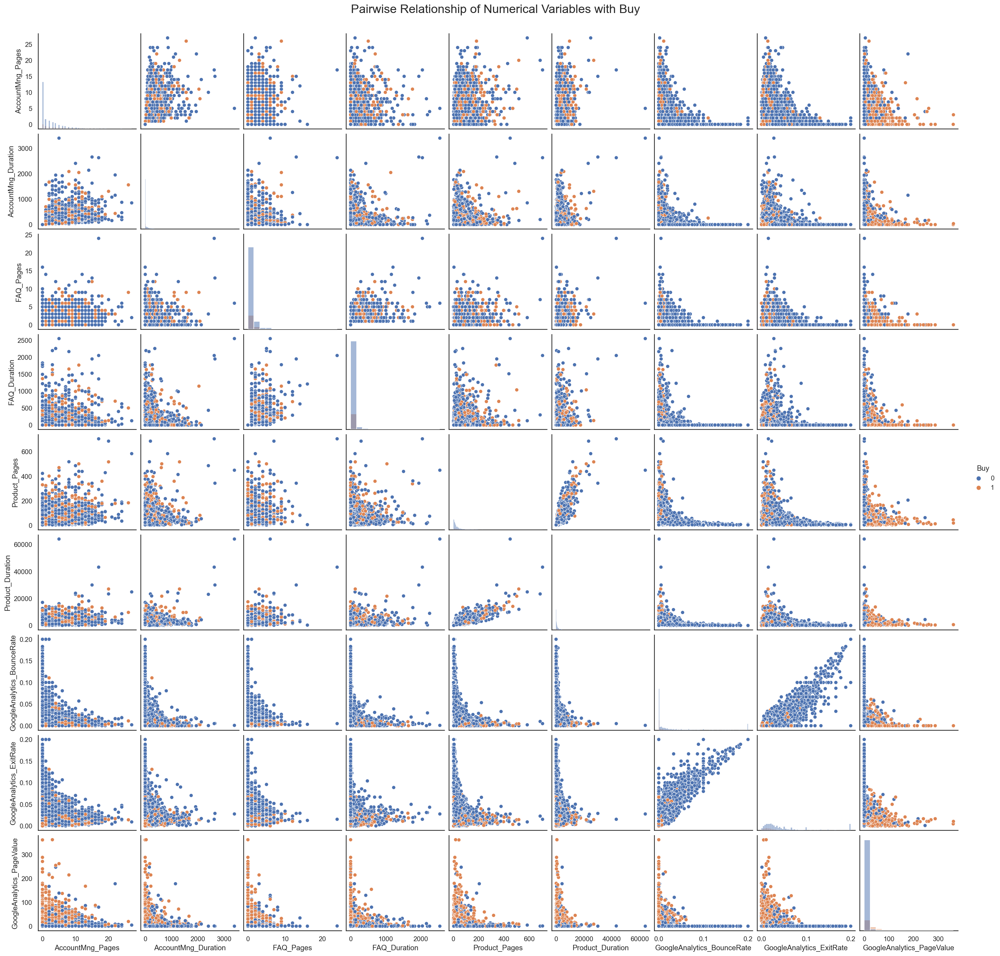

In [187]:
# sns.set_theme(style="white")

# sns.pairplot(df[['AccountMng_Pages','AccountMng_Duration','FAQ_Pages','FAQ_Duration','Product_Pages','Product_Duration','GoogleAnalytics_BounceRate','GoogleAnalytics_ExitRate','GoogleAnalytics_PageValue','Buy']], diag_kind="hist", hue = 'Buy' )

# plt.subplots_adjust(top=0.95)
# plt.suptitle("Pairwise Relationship of Numerical Variables with Buy", fontsize=20)
# plt.savefig(os.path.join('../techscape-ecommerce/figures', 'pairwise'), dpi=200)

# plt.show()

In [188]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Access_ID                   9999 non-null   int64  
 1   Date                        9999 non-null   object 
 2   AccountMng_Pages            9999 non-null   int64  
 3   AccountMng_Duration         9999 non-null   float64
 4   FAQ_Pages                   9999 non-null   int64  
 5   FAQ_Duration                9999 non-null   float64
 6   Product_Pages               9999 non-null   int64  
 7   Product_Duration            9999 non-null   float64
 8   GoogleAnalytics_BounceRate  9999 non-null   float64
 9   GoogleAnalytics_ExitRate    9999 non-null   float64
 10  GoogleAnalytics_PageValue   9999 non-null   float64
 11  OS                          9999 non-null   object 
 12  Browser                     9999 non-null   int64  
 13  Country                     9999 

In [189]:
df.isna().sum()

Access_ID                     0
Date                          0
AccountMng_Pages              0
AccountMng_Duration           0
FAQ_Pages                     0
FAQ_Duration                  0
Product_Pages                 0
Product_Duration              0
GoogleAnalytics_BounceRate    0
GoogleAnalytics_ExitRate      0
GoogleAnalytics_PageValue     0
OS                            0
Browser                       0
Country                       0
Type_of_Traffic               0
Type_of_Visitor               0
Buy                           0
dtype: int64

## Data Preparation

### Access_ID

<b>Unique identification of the user access to the website
* The Access_ID variable is 100% distinct across all records, hence we can use it as an index.

In [190]:
df = df.set_index(["Access_ID"])
test = test.set_index(["Access_ID"])

### Date

<b>Website visit date

* For practicality it was decided to convert the date variable to a datetime object

In [191]:
df["Date"] = pd.to_datetime(df["Date"], format = "%d-%b-%y")
test["Date"] = pd.to_datetime(test["Date"], format = "%d-%b-%y")

In [192]:
# Checking datatypes
df.dtypes

Date                          datetime64[ns]
AccountMng_Pages                       int64
AccountMng_Duration                  float64
FAQ_Pages                              int64
FAQ_Duration                         float64
Product_Pages                          int64
Product_Duration                     float64
GoogleAnalytics_BounceRate           float64
GoogleAnalytics_ExitRate             float64
GoogleAnalytics_PageValue            float64
OS                                    object
Browser                                int64
Country                               object
Type_of_Traffic                        int64
Type_of_Visitor                       object
Buy                                    int64
dtype: object

In [193]:
def conversion_type(df):
    df['AccountMng_Pages']=df['AccountMng_Pages'].astype(pd.Int32Dtype())
    df['AccountMng_Duration']=df['AccountMng_Duration'].astype(pd.Float32Dtype())
    df['FAQ_Pages']=df['FAQ_Pages'].astype(pd.Int32Dtype())
    df['FAQ_Duration']=df['FAQ_Duration'].astype(pd.Float32Dtype())
    df['Product_Pages']=df['Product_Pages'].astype(pd.Int32Dtype())
    df['Product_Duration']=df['Product_Duration'].astype(pd.Float32Dtype())
    df['GoogleAnalytics_BounceRate']=df['GoogleAnalytics_BounceRate'].astype(pd.Float32Dtype())
    df['GoogleAnalytics_ExitRate']=df['GoogleAnalytics_ExitRate'].astype(pd.Float32Dtype())
    df['GoogleAnalytics_PageValue']=df['GoogleAnalytics_PageValue'].astype(pd.Float32Dtype())
    df['OS']=df['OS'].astype(pd.StringDtype())
    df['Browser']=df['Browser'].astype(pd.Int32Dtype())
    df['Country']=df['Country'].astype(pd.StringDtype())
    df['Type_of_Traffic']=df['Type_of_Traffic'].astype(pd.Int32Dtype())
    df['Type_of_Visitor']=df['Type_of_Visitor'].astype(pd.StringDtype())

In [194]:
conversion_type(df)
conversion_type(test)
df['Buy']=df['Buy'].astype(pd.Int32Dtype())

In [195]:
df.dtypes

Date                          datetime64[ns]
AccountMng_Pages                       Int32
AccountMng_Duration                  Float32
FAQ_Pages                              Int32
FAQ_Duration                         Float32
Product_Pages                          Int32
Product_Duration                     Float32
GoogleAnalytics_BounceRate           Float32
GoogleAnalytics_ExitRate             Float32
GoogleAnalytics_PageValue            Float32
OS                                    string
Browser                                Int32
Country                               string
Type_of_Traffic                        Int32
Type_of_Visitor                       string
Buy                                    Int32
dtype: object

<hr>
<a class="anchor" id="Coherence">
    
# 3. Coherence Checking
    
</a>

In [196]:
# confirming that the first and last day of every month is correct
df['day']=df['Date'].dt.day
df.groupby(df['Date'].dt.month).agg(['min', 'max'])['day']

,min,max
Date,,
2,1,29
3,1,31
5,1,31
6,1,30
7,1,31
8,1,31
9,1,30
10,1,31
11,1,30


In [197]:
df['Product_Pages'] = np.where(
    ((df['Product_Pages']>0) & (df['Product_Duration']==0)), 0,df['Product_Pages']) 

df['AccountMng_Pages'] = np.where(
    ((df['AccountMng_Pages']>0) & (df['AccountMng_Duration']==0)), 0,df['AccountMng_Pages']) 

df['FAQ_Pages'] = np.where(
    ((df['FAQ_Pages']>0) & (df['FAQ_Duration']==0)), 0,df['FAQ_Pages']) 

df['Product_Pages']=df['Product_Pages'].astype(pd.Int32Dtype())
df['AccountMng_Pages']=df['AccountMng_Pages'].astype(pd.Int32Dtype())
df['FAQ_Pages']=df['FAQ_Pages'].astype(pd.Int32Dtype())

In [198]:
df[ (df['FAQ_Pages']>0) & (df['FAQ_Duration']==0)]

,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy,day
Access_ID,,,,,,,,,,,,,,,,,


In [199]:
df[~(
    
        ((df['AccountMng_Duration']>0) & (df['AccountMng_Pages']==0))|
        ((df['AccountMng_Duration']==0) & (df['AccountMng_Pages']>0))|
        ((df['FAQ_Pages']>0) & (df['FAQ_Duration']==0))|
        ((df['FAQ_Pages']==0) & (df['FAQ_Duration']>0))|
        ((df['Product_Pages']==0) & (df['Product_Duration']>0))|
        ((df['Product_Pages']>0) & (df['Product_Duration']==0))|
        (df['GoogleAnalytics_BounceRate']>1)|
        (df['GoogleAnalytics_BounceRate']<0)|

        (df['GoogleAnalytics_ExitRate']>1)|
        (df['GoogleAnalytics_ExitRate']<0)|
        (df['GoogleAnalytics_BounceRate']>1)|
        (df['GoogleAnalytics_BounceRate']<0)|
        (df['Date']>dt.datetime(2020,12,31))|
        (df['Date']<dt.datetime(2020,1,31))
    
        )]

,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy,day
Access_ID,,,,,,,,,,,,,,,,,
102863333,2020-03-21,0,0.0,0,0.0,3,64.0,0.0,0.0667,0.0,MacOSX,2,Portugal,1,Returner,0,21
103117814,2020-05-20,0,0.0,0,0.0,23,684.5,0.0217,0.0449,0.0,Windows,2,France,6,Returner,0,20
103201891,2020-12-04,0,0.0,0,0.0,8,95.0,0.025,0.0583,0.0,Windows,4,Italy,1,Returner,0,4
103226087,2020-12-22,0,0.0,0,0.0,9,608.75,0.0,0.025,42.422501,Windows,2,United Kingdom,2,Returner,1,22
103234445,2020-11-24,0,0.0,2,386.0,36,1609.939697,0.0,0.0093,12.5033,Windows,2,Spain,3,Returner,1,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
798279589,2020-05-08,3,159.0,2,55.5,23,1100.125,0.0,0.0111,0.0,MacOSX,2,Brazil,14,Returner,0,8
798314158,2020-07-17,6,175.100006,0,0.0,3,27.6,0.0,0.0111,0.0,Windows,10,Spain,5,New_Access,0,17
798339820,2020-03-23,0,0.0,0,0.0,27,644.0,0.0077,0.0519,0.0,MacOSX,2,France,3,Returner,0,23


<hr>
<a class="anchor" id="Split">
    
# 2. Split the data
    
</a>

In [200]:
X = df.drop("Buy", axis = 1)
y = df["Buy"]

In [201]:
X_train, X_val, y_train, y_val = train_test_split(X,y, stratify = y, train_size = 0.70,random_state = 0, shuffle = True)

### Separate Numerical from Categorical 

In [202]:
non_num_feat=['Date', 'OS', 'Country', 'Type_of_Traffic', 'Type_of_Visitor', 'day','Browser']
X_train_num = X_train.drop(columns=non_num_feat)
X_train_cat=X_train[non_num_feat]

X_val_num = X_val.drop(columns=non_num_feat)
X_val_cat=X_val[non_num_feat]

<hr>
<a class="anchor" id="outliers">
    
# 2. Outliers Treatment
    
</a>

<b>Using drop_outliers to drop unwanted outliers from df </b>
* Having analysed the distrbution of this variable, it became apparent that there may be outliers.
* It was decided to drop the outliers and then later on reintroduce them if, as a result, the accuracy of the model suffered. Dropped 1.3% records from the dataset.

<hr>
<a class="anchor" id="AutomaticLimitation">
    
## Manual Limitation
    
</a>

Text(0.5, 0.98, "Numeric Variables' Histograms")

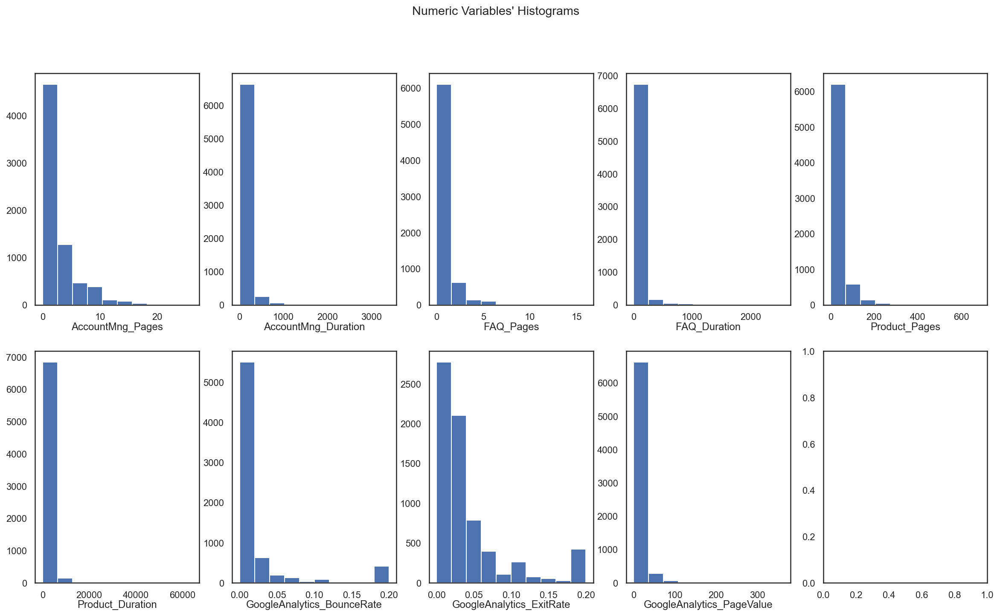

In [203]:
# %matplotlib inline

# sns.set_theme(style="white")

# fig, axes = plt.subplots(2, ceil(len(X_train_num.columns.tolist()) / 2), figsize=(20, 11))

# for ax, feat in zip(axes.flatten(), (X_train_num.columns.tolist())):
#     ax.hist(X_train_num[feat])
#     ax.set_title(feat, y=-0.13)

# title = "Numeric Variables' Histograms"

# plt.suptitle(title)

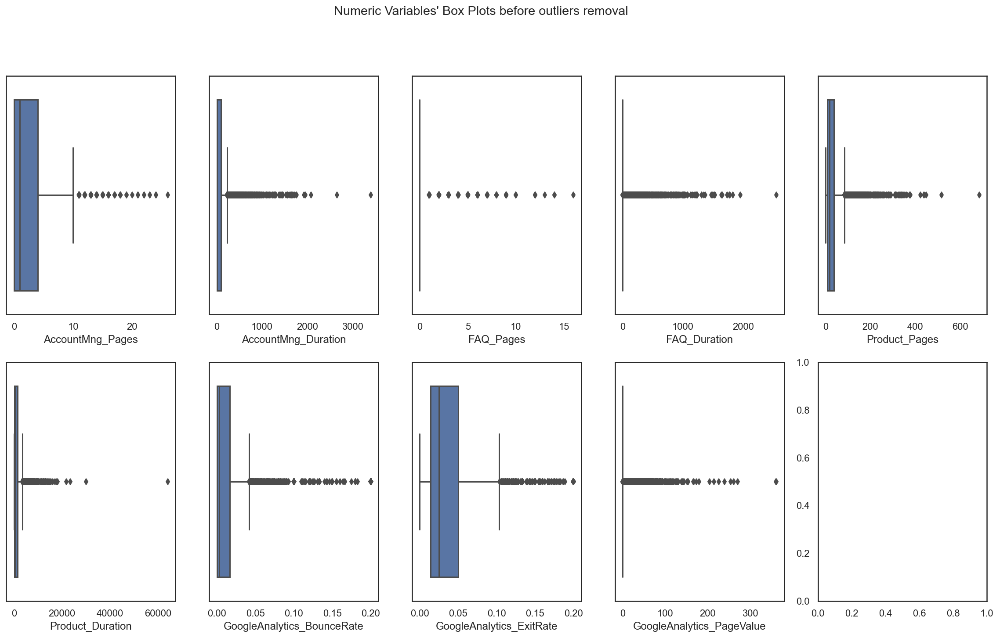

In [204]:
# %matplotlib inline

# sns.set_theme(style="white")

# fig, axes = plt.subplots(2, ceil(len(X_train_num.columns.tolist()) / 2), figsize=(20, 11))

# for ax, feat in zip(axes.flatten(), X_train_num.columns.tolist()): 
#     sns.boxplot(x=X_train[feat], ax=ax)

# title = "Numeric Variables' Box Plots before outliers removal"

# plt.suptitle(title)

# plt.show()

In [205]:
filters1 = (
         (X_train['AccountMng_Pages']<=19)
         &
         (X_train['AccountMng_Duration']<=2000)
         &
         (X_train['FAQ_Pages']<=6)
         &
         (X_train['FAQ_Duration']<=1100)
         &
         (X_train['Product_Pages']<=400)
         &
         (X_train['Product_Duration']<=15000)
         &
         (X_train['GoogleAnalytics_BounceRate']<=0.20)
         &
         (X_train['GoogleAnalytics_ExitRate']<=0.20)
         &
         (X_train['GoogleAnalytics_PageValue']<=165)
         )

teste=X_train[filters1]

In [206]:
#def manual_filter(df):
def filter_outlier(df):
    filters1 = (
         (df['AccountMng_Pages']<=19)
         &
         (df['AccountMng_Duration']<=2000)
         &
         (df['FAQ_Pages']<=6)
         &
         (df['FAQ_Duration']<=1100)
         &
         (df['Product_Pages']<=400)
         &
         (df['Product_Duration']<=15000)
         &
         (df['GoogleAnalytics_BounceRate']<=0.20)
         &
         (df['GoogleAnalytics_ExitRate']<=0.20)
         &
         (df['GoogleAnalytics_PageValue']<=165)
         )
    return df[filters1],df[~filters1].index

In [207]:
index_out_train=filter_outlier(X_train)[1].tolist()

In [208]:
X_train_no_out=filter_outlier(X_train)[0]
X_val_no_out=X_val.copy()

In [209]:
X_train_out=X_train.copy()
X_val_out=X_val.copy()

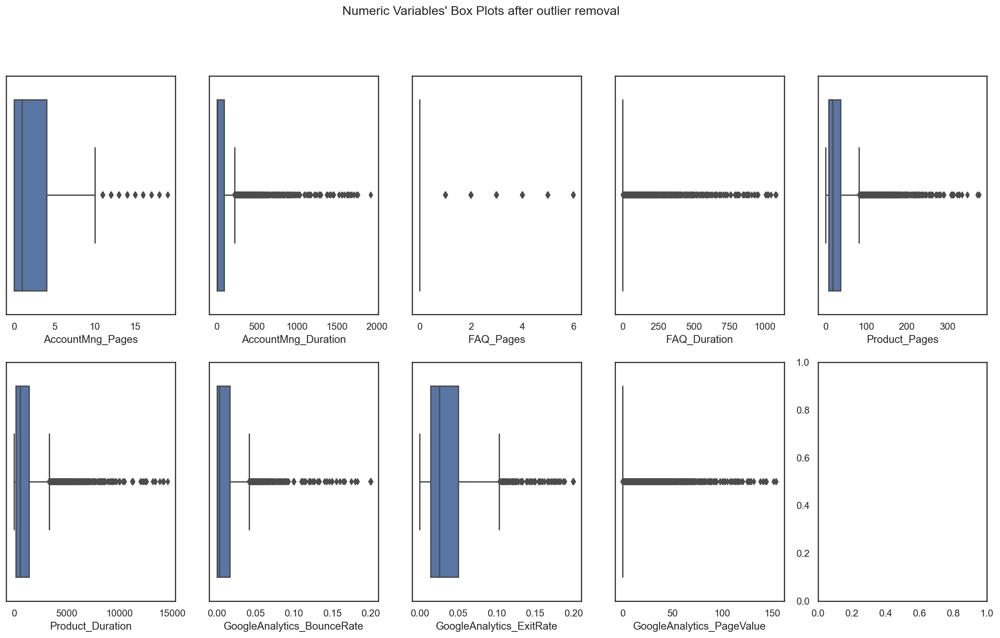

In [210]:
# # All Numeric Variables' Box Plots in one figure
# %matplotlib inline

# sns.set_theme(style="white")
# # Prepare figure. Create individual axes where each box plot will be placed
# fig, axes = plt.subplots(2, ceil(len(X_train_no_out.drop(columns=non_num_feat, axis=1).columns.tolist()) / 2), figsize=(20, 11))

# # Plot data
# # Iterate across axes objects and associate each box plot (hint: use the ax argument):
# for ax, feat in zip(axes.flatten(), teste.drop(columns=non_num_feat, axis=1).columns.tolist()): # Notice the zip() function and flatten() method
#     sns.boxplot(x=(X_train_no_out[feat]), ax=ax)
    
# # Layout
# # Add a centered title to the figure:
# title = "Numeric Variables' Box Plots after outlier removal"

# plt.suptitle(title)


# plt.show()

In [211]:
X_train_no_out[X_train_no_out['FAQ_Pages']>4]

,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,day
Access_ID,,,,,,,,,,,,,,,,
780687553,2020-11-30,7,167.375,6,135.0,155,4263.977539,0.0054,0.012,112.6661,Android,2,Portugal,2,Returner,30
351386702,2020-12-14,7,177.5,6,312.0,40,1123.050781,0.0087,0.0247,0.0,Android,1,Spain,2,Returner,14
743264226,2020-05-20,2,60.0,6,459.0,17,1370.067871,0.0217,0.0351,0.0,Android,1,Other,1,Returner,20
442488118,2020-05-08,0,0.0,5,161.5,60,2789.166748,0.0,0.005,31.318899,Windows,2,Other,2,Returner,8
651464584,2020-10-25,2,82.599998,6,316.0,34,1446.733276,0.0,0.0024,0.0,iOS,1,Brazil,2,New_Access,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251382158,2020-05-30,3,604.5,6,75.666702,50,2387.435791,0.0194,0.0378,0.0,Android,1,Spain,12,Returner,30
701868956,2020-05-14,2,58.0,5,115.0,71,1563.93103,0.0066,0.0172,0.0,MacOSX,2,Portugal,4,Returner,14
269080453,2020-12-29,8,167.910706,6,547.75,111,6340.152344,0.0034,0.0094,44.219799,MacOSX,2,Other,2,Returner,29


In [212]:

y_train_df=pd.DataFrame(y_train)

y_train_df=y_train_df[~y_train_df.index.isin(index_out_train)]
y_roc=y_train_df

In [213]:

y_val_df=pd.DataFrame(y_val)


In [214]:
X_train_no_out_num = X_train_no_out.drop(columns=non_num_feat)
X_train_no_out_cat=X_train_no_out[non_num_feat]

<hr>
<a class="anchor" id="2dim_outliers">
    
## Multi-dimentional outliers
    
</a>

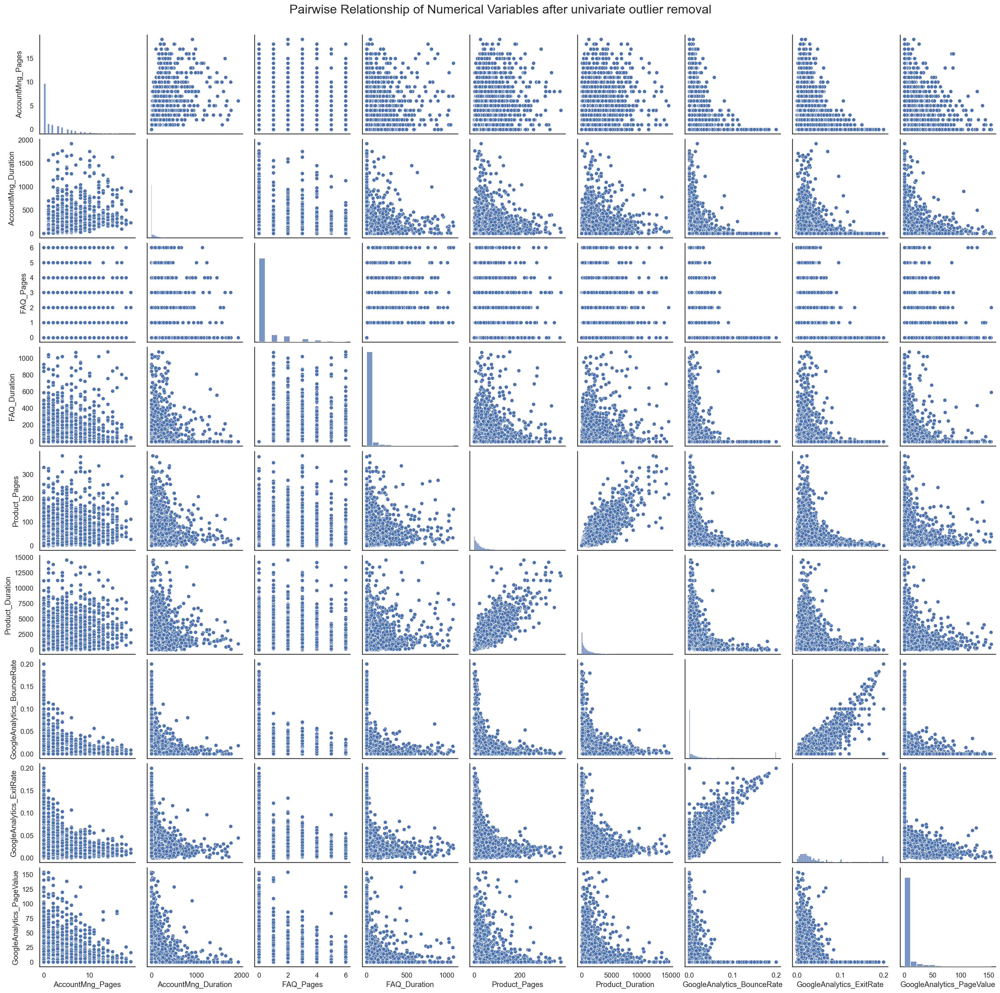

In [215]:
# # Pairwise Relationship of Numerical Variables

# sns.set_theme(style="white")
# # Setting pairplot
# sns.pairplot(X_train_no_out_num, diag_kind="hist")

# # Layout
# plt.subplots_adjust(top=0.95)
# plt.suptitle("Pairwise Relationship of Numerical Variables after univariate outlier removal", fontsize=20)


# plt.show()

<hr>
<a class="anchor" id="FeatureEngeneering">
    
# Feature Engineering
    
</a>

In [216]:
def feat_eng(df):

   
    df['avg_duration_account'] = np.where(
        df['AccountMng_Pages']==0, 0,np.divide(df['AccountMng_Duration'],df['AccountMng_Pages'])) 

    df['avg_duration_FAQ'] = np.where(
        df['FAQ_Pages']==0, 0,np.divide(df['FAQ_Duration'],df['FAQ_Pages'])) 

    df['avg_duration_product'] = np.where(
        df['Product_Pages']==0, 0,np.divide(df['Product_Duration'],df['Product_Pages'])) 
   
    df['log_AccountMng_Duration']=np.log10(df['AccountMng_Duration']+1)
    df['log_AccountMng_Pages']=np.log10(df['AccountMng_Pages']+1)
    df['log_FAQ_Duration']=np.log10(df['FAQ_Duration']+1)
    df['log_FAQ_Pages']=np.log10(df['FAQ_Pages']+1)
    df['log_Product_Duration']=np.log10(df['Product_Duration']+1)
    df['log_Product_Pages']=np.log10(df['Product_Pages']+1)
    df['log_BounceRate']=np.log10(df['GoogleAnalytics_BounceRate']+1)
    df['log_ExitRate']=np.log10(df['GoogleAnalytics_ExitRate']+1)
    df['log_PageValue']=np.log10(df['GoogleAnalytics_PageValue']+1)
    df['month']=df['Date'].dt.month
    df['during_covid']=np.where(df['month']<=3,0,1) 

    summer = [7, 8, 9]
    autumn = [10, 11, 12]
    winter = [1, 2, 3]
    spring = [4, 5, 6]

    mobile = ['Android', 'iOS']
    computer = ['Chrome OS', 'Fedora', 'Ubuntu', 'Windows', 'MacOSX']

    weekend = [5, 6]

    df['summer'] = np.where(df['month'].isin(summer), 1, 0)
    df['autumn'] = np.where(df['month'].isin(autumn), 1, 0)
    df['winter'] = np.where(df['month'].isin(winter), 1, 0)
    df['spring'] = np.where(df['month'].isin(spring), 1, 0)


    df['mobile'] = np.where(df['OS'].isin(mobile), 1, 0)
    df['computer'] = np.where(df['OS'].isin(computer), 1, 0)

    df['Traffic2_and_computer'] = np.where((df['Type_of_Traffic'] == 2) & (df['computer'] == 1), 1, 0)

    df['Returning_and_computer'] = np.where((df['Type_of_Visitor'] == 'Returner') & (df['computer'] == 1), 1, 0)

    df['weekday'] = pd.to_datetime(df['Date']).apply(lambda x: x.weekday())
    df['weekend'] = np.where(df['weekday'].isin(weekend), 1, 0)

In [217]:
feat_eng(X_train_no_out)
feat_eng(X_val_no_out)
feat_eng(test)

feat_eng(X_train_out)
feat_eng(X_val_out)

## One Hot_encoding

#### Train dataset

In [218]:
ohc_feat_list = ['Browser','Country','OS','Type_of_Visitor','Type_of_Traffic']

In [219]:
# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame 
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder(sparse=False)
ohc_feat = ohc.fit_transform(X_train_no_out[ohc_feat_list])
ohc_feat_names = ohc.get_feature_names()
ohc_X_train = pd.DataFrame(ohc_feat, index=X_train_no_out.index, columns=ohc_feat_names)
ohc_X_train.columns

Index(['x0_1', 'x0_2', 'x0_3', 'x0_4', 'x0_5', 'x0_6', 'x0_7', 'x0_8', 'x0_10',
       'x0_11', 'x0_12', 'x0_13', 'x1_Brazil', 'x1_France', 'x1_Germany',
       'x1_Italy', 'x1_Other', 'x1_Portugal', 'x1_Spain', 'x1_Switzerland',
       'x1_United Kingdom', 'x2_Android', 'x2_Chrome OS', 'x2_Fedora',
       'x2_MacOSX', 'x2_Other', 'x2_Ubuntu', 'x2_Windows', 'x2_iOS',
       'x3_New_Access', 'x3_Other', 'x3_Returner', 'x4_1', 'x4_2', 'x4_3',
       'x4_4', 'x4_5', 'x4_6', 'x4_7', 'x4_8', 'x4_9', 'x4_10', 'x4_11',
       'x4_12', 'x4_13', 'x4_14', 'x4_15'],
      dtype='object')

In [220]:
ohc_X_train.rename(columns={'x0_1':'browser1','x0_2':'browser2','x0_3':'browser3','x0_4':'browser4','x0_5':'browser5','x0_6':'browser6','x0_7':'browser7','x0_8':'browser8','x0_9':'browser9','x0_10':'browser10','x0_11':'browser11','x0_12':'browser12','x0_13':'browser13','x4_1':'traffic1','x4_2':'traffic2', 'x4_3':'traffic3', 'x4_4':'traffic4', 'x4_5':'traffic5', 'x4_6':'traffic6', 'x4_7':'traffic7', 'x4_8':'traffic8',
       'x4_9':'traffic9', 'x4_10':'traffic10', 'x4_11':'traffic11', 'x4_12':'traffic12', 'x4_13':'traffic13', 'x4_14':'traffic14', 'x4_15':'traffic15'},inplace=True)

In [221]:
X_train_eng = X_train_no_out.join(ohc_X_train)
X_train_eng_minus1=X_train_eng.copy() 

#### Test dataset

In [222]:
ohc_feat_test = ohc.fit_transform(test[ohc_feat_list])
ohc_feat_test_names = ohc.get_feature_names()
ohc_X_test = pd.DataFrame(ohc_feat_test, index = test.index, columns = ohc_feat_test_names)
ohc_X_test.columns

Index(['x0_1', 'x0_2', 'x0_3', 'x0_4', 'x0_5', 'x0_6', 'x0_7', 'x0_8', 'x0_9',
       'x0_10', 'x0_11', 'x0_12', 'x0_13', 'x1_Brazil', 'x1_France',
       'x1_Germany', 'x1_Italy', 'x1_Other', 'x1_Portugal', 'x1_Spain',
       'x1_Switzerland', 'x1_United Kingdom', 'x2_Android', 'x2_Chrome OS',
       'x2_Fedora', 'x2_MacOSX', 'x2_Other', 'x2_Ubuntu', 'x2_Windows',
       'x2_iOS', 'x3_New_Access', 'x3_Other', 'x3_Returner', 'x4_1', 'x4_2',
       'x4_3', 'x4_4', 'x4_5', 'x4_6', 'x4_7', 'x4_8', 'x4_9', 'x4_10',
       'x4_11', 'x4_12', 'x4_13', 'x4_14', 'x4_15'],
      dtype='object')

In [223]:
ohc_X_test.rename(columns={'x0_1':'browser1','x0_2':'browser2','x0_3':'browser3','x0_4':'browser4','x0_5':'browser5','x0_6':'browser6','x0_7':'browser7','x0_8':'browser8','x0_9':'browser9','x0_10':'browser10','x0_11':'browser11','x0_12':'browser12','x0_13':'browser13','x4_1':'traffic1','x4_2':'traffic2', 'x4_3':'traffic3', 'x4_4':'traffic4', 'x4_5':'traffic5', 'x4_6':'traffic6', 'x4_7':'traffic7', 'x4_8':'traffic8',
       'x4_9':'traffic9', 'x4_10':'traffic10', 'x4_11':'traffic11', 'x4_12':'traffic12', 'x4_13':'traffic13', 'x4_14':'traffic14', 'x4_15':'traffic15'},inplace=True)

In [224]:
X_test_eng = test.join(ohc_X_test)

In [225]:
X_test_robust=X_test_eng.copy()

#### Validation dataset

In [226]:
ohc_feat_val = ohc.fit_transform(X_val_no_out[ohc_feat_list])
ohc_feat_val_names = ohc.get_feature_names()
ohc_X_val = pd.DataFrame(ohc_feat_val, index = X_val_no_out.index, columns = ohc_feat_val_names)  # Why the index=df_ohc.index?
ohc_X_val.columns

Index(['x0_1', 'x0_2', 'x0_3', 'x0_4', 'x0_5', 'x0_6', 'x0_7', 'x0_8', 'x0_10',
       'x0_12', 'x0_13', 'x1_Brazil', 'x1_France', 'x1_Germany', 'x1_Italy',
       'x1_Other', 'x1_Portugal', 'x1_Spain', 'x1_Switzerland',
       'x1_United Kingdom', 'x2_Android', 'x2_Chrome OS', 'x2_MacOSX',
       'x2_Other', 'x2_Ubuntu', 'x2_Windows', 'x2_iOS', 'x3_New_Access',
       'x3_Other', 'x3_Returner', 'x4_1', 'x4_2', 'x4_3', 'x4_4', 'x4_5',
       'x4_6', 'x4_7', 'x4_8', 'x4_9', 'x4_10', 'x4_11', 'x4_12', 'x4_13',
       'x4_14', 'x4_15'],
      dtype='object')

In [227]:
ohc_X_val.rename(columns={'x0_1':'browser1','x0_2':'browser2','x0_3':'browser3','x0_4':'browser4','x0_5':'browser5','x0_6':'browser6','x0_7':'browser7','x0_8':'browser8','x0_9':'browser9','x0_10':'browser10','x0_11':'browser11','x0_12':'browser12','x0_13':'browser13','x4_1':'traffic1','x4_2':'traffic2', 'x4_3':'traffic3', 'x4_4':'traffic4', 'x4_5':'traffic5', 'x4_6':'traffic6', 'x4_7':'traffic7', 'x4_8':'traffic8',
       'x4_9':'traffic9', 'x4_10':'traffic10', 'x4_11':'traffic11', 'x4_12':'traffic12', 'x4_13':'traffic13', 'x4_14':'traffic14', 'x4_15':'traffic15'},inplace=True)

In [228]:
X_val_eng = X_val_no_out.join(ohc_X_val)
X_val_eng_minus1=X_val_eng.copy()

In [229]:
binary_list=ohc_X_train.columns.to_list()+['during_covid', 'computer', 'mobile', 'summer', 'autumn', 'winter', 'spring', 'Traffic2_and_computer', 'Returning_and_computer', 'weekend']


In [230]:
non_num_feat1=non_num_feat+binary_list+['month','weekday']

In [231]:
X_train_eng_num = X_train_eng.drop(columns=non_num_feat1)

In [232]:
non_num_feat_alter=non_num_feat1.copy()
non_num_feat_alter.remove('browser11')
non_num_feat_alter.remove('x2_Fedora')

In [233]:
X_val_eng_num = X_val_eng.drop(columns=non_num_feat_alter,axis=1)

### ONE HOT ENCODING FOR OUTLIERS 

In [234]:
ohc_feat = ohc.fit_transform(X_train_out[ohc_feat_list])
ohc_feat_names = ohc.get_feature_names()
ohc_X_train_out = pd.DataFrame(ohc_feat, index=X_train_out.index, columns=ohc_feat_names)
ohc_X_train_out.columns

ohc_X_train_out.rename(columns={'x0_1':'browser1','x0_2':'browser2','x0_3':'browser3','x0_4':'browser4','x0_5':'browser5','x0_6':'browser6','x0_7':'browser7','x0_8':'browser8','x0_9':'browser9','x0_10':'browser10','x0_11':'browser11','x0_12':'browser12','x0_13':'browser13','x4_1':'traffic1','x4_2':'traffic2', 'x4_3':'traffic3', 'x4_4':'traffic4', 'x4_5':'traffic5', 'x4_6':'traffic6', 'x4_7':'traffic7', 'x4_8':'traffic8',
       'x4_9':'traffic9', 'x4_10':'traffic10', 'x4_11':'traffic11', 'x4_12':'traffic12', 'x4_13':'traffic13', 'x4_14':'traffic14', 'x4_15':'traffic15'},inplace=True)

X_train_out = X_train_out.join(ohc_X_train_out)

In [235]:
ohc_feat = ohc.fit_transform(X_val_out[ohc_feat_list])
ohc_feat_names = ohc.get_feature_names()
ohc_X_val_out = pd.DataFrame(ohc_feat, index=X_val_out.index, columns=ohc_feat_names)
ohc_X_val_out.columns

ohc_X_val_out.rename(columns={'x0_1':'browser1','x0_2':'browser2','x0_3':'browser3','x0_4':'browser4','x0_5':'browser5','x0_6':'browser6','x0_7':'browser7','x0_8':'browser8','x0_9':'browser9','x0_10':'browser10','x0_11':'browser11','x0_12':'browser12','x0_13':'browser13','x4_1':'traffic1','x4_2':'traffic2', 'x4_3':'traffic3', 'x4_4':'traffic4', 'x4_5':'traffic5', 'x4_6':'traffic6', 'x4_7':'traffic7', 'x4_8':'traffic8',
       'x4_9':'traffic9', 'x4_10':'traffic10', 'x4_11':'traffic11', 'x4_12':'traffic12', 'x4_13':'traffic13', 'x4_14':'traffic14', 'x4_15':'traffic15'},inplace=True)

X_val_out = X_val_out.join(ohc_X_val_out)

In [236]:
metric_feat=X_train_eng_num.columns.to_list()

<hr>
<a class="anchor" id="scale">
    
# Scaling Data
    
</a>

### MINMAX(0,1)

In [237]:
scaler = MinMaxScaler().fit(X_train_eng[metric_feat])
X_train_eng_num_scaled_min = scaler.transform(X_train_eng[metric_feat]) 

X_train_eng[metric_feat] = pd.DataFrame(X_train_eng_num_scaled_min, columns = metric_feat).set_index(X_train_eng[metric_feat].index)

X_train_eng.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,6902.0,0.117769,0.168061,0.0,0.000000,0.052632,0.210526,1.0
AccountMng_Duration,6902.0,0.039668,0.084042,0.0,0.000000,0.003122,0.045695,1.0
FAQ_Pages,6902.0,0.071042,0.176028,0.0,0.000000,0.000000,0.000000,1.0
FAQ_Duration,6902.0,0.024226,0.089551,0.0,0.000000,0.000000,0.000000,1.0
Product_Pages,6902.0,0.080467,0.104084,0.0,0.018519,0.046296,0.097884,1.0
...,...,...,...,...,...,...,...,...
traffic11,6902.0,0.019704,0.138993,0.0,0.000000,0.000000,0.000000,1.0
traffic12,6902.0,0.004347,0.065790,0.0,0.000000,0.000000,0.000000,1.0
traffic13,6902.0,0.059258,0.236124,0.0,0.000000,0.000000,0.000000,1.0
traffic14,6902.0,0.002608,0.051005,0.0,0.000000,0.000000,0.000000,1.0


In [238]:
X_val_num_scaled = scaler.transform(X_val_eng[metric_feat])
X_val_eng[metric_feat] = pd.DataFrame(X_val_num_scaled, columns = metric_feat).set_index(X_val_eng.index)
X_val_eng.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,3000.0,0.121175,0.176741,0.0,0.000000,0.052632,0.210526,1.421053
AccountMng_Duration,3000.0,0.043881,0.097902,0.0,0.000000,0.004839,0.050078,1.367978
FAQ_Pages,3000.0,0.079667,0.211085,0.0,0.000000,0.000000,0.000000,4.000000
FAQ_Duration,3000.0,0.031929,0.130749,0.0,0.000000,0.000000,0.000000,2.090060
Product_Pages,3000.0,0.082826,0.124582,0.0,0.018519,0.047619,0.097884,1.865079
...,...,...,...,...,...,...,...,...
traffic11,3000.0,0.021333,0.144517,0.0,0.000000,0.000000,0.000000,1.000000
traffic12,3000.0,0.004667,0.068165,0.0,0.000000,0.000000,0.000000,1.000000
traffic13,3000.0,0.061000,0.239370,0.0,0.000000,0.000000,0.000000,1.000000
traffic14,3000.0,0.002667,0.051579,0.0,0.000000,0.000000,0.000000,1.000000


In [239]:
X_test_eng_scaled = scaler.transform(X_test_eng[metric_feat])
X_test_eng[metric_feat] = pd.DataFrame(X_test_eng_scaled, columns = X_test_eng[metric_feat].columns).set_index(X_test_eng[metric_feat].index)
X_test_eng.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,2300.0,0.120526,0.171174,0.0,0.000000,0.052632,0.210526,1.210526
AccountMng_Duration,2300.0,0.041509,0.085561,0.0,0.000000,0.004448,0.050911,1.415453
FAQ_Pages,2300.0,0.081087,0.205719,0.0,0.000000,0.000000,0.000000,2.000000
FAQ_Duration,2300.0,0.031733,0.134744,0.0,0.000000,0.000000,0.000000,2.085538
Product_Pages,2300.0,0.084467,0.116800,0.0,0.021164,0.047619,0.100529,1.412698
...,...,...,...,...,...,...,...,...
traffic11,2300.0,0.017391,0.130753,0.0,0.000000,0.000000,0.000000,1.000000
traffic12,2300.0,0.002609,0.051020,0.0,0.000000,0.000000,0.000000,1.000000
traffic13,2300.0,0.061739,0.240733,0.0,0.000000,0.000000,0.000000,1.000000
traffic14,2300.0,0.002609,0.051020,0.0,0.000000,0.000000,0.000000,1.000000


# Comparing Scales

### MinMax(-1,1)

In [240]:
# metric_feat_test=[ 'FAQ_Duration',
#  'Product_Duration',
#  'GoogleAnalytics_BounceRate',
#  'GoogleAnalytics_ExitRate',
#  'GoogleAnalytics_PageValue']


In [241]:
# min_max2 = MinMaxScaler(feature_range=(-1,1)).fit(X_train_eng_minus1[metric_feat_test])

# min_max2_X_train = min_max2.transform(X_train_eng_minus1[metric_feat_test])

# min_max2_X_val = min_max2.transform(X_val_eng_minus1[metric_feat_test])

# model_min_max2 = KNeighborsClassifier(n_neighbors=5).fit(min_max2_X_train, y_train_df.squeeze().to_list(),)
# mean(cross_val_score(model_min_max2, min_max2_X_val,  y_val_df.squeeze().to_list(), cv=5,scoring=make_scorer(f1_score, average='binary')))
# #model_min_max2.f1_score(min_max2_X_val,y_val_df.squeeze().to_list())

0.5782008162197918

### MinMax(0,1)

In [242]:
# model_min_max1 = KNeighborsClassifier(n_neighbors=5).fit(X_train_eng[metric_feat_test], y_train_df.squeeze().to_list())

# model_min_max1.score(X_val_eng[metric_feat_test], y_val_df.squeeze().to_list())
# mean(cross_val_score(model_min_max1, X_val_eng[metric_feat_test],  y_val_df.squeeze().to_list(), cv=5,scoring=make_scorer(f1_score, average='binary')))

0.5782008162197918

Text(0.5, 0.98, 'F1 score comparison for different scales')

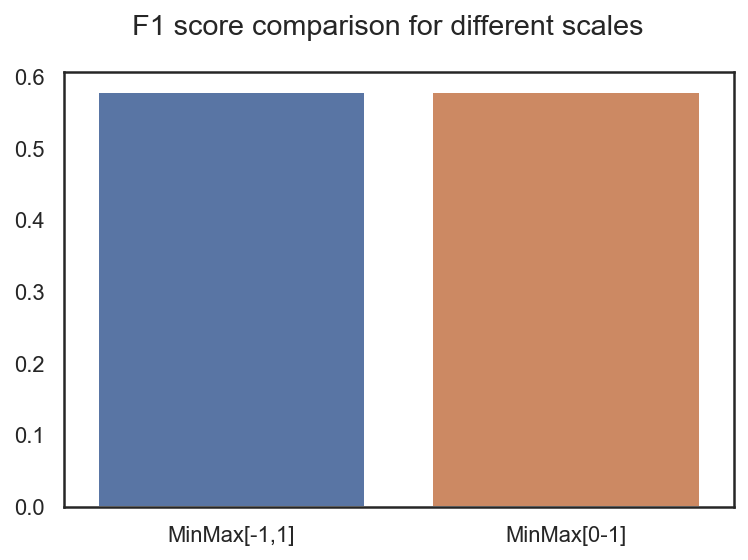

In [243]:
# sns.set_theme(style="white")
# x = ['MinMax[-1,1]','MinMax[0-1]']
# y = [mean(cross_val_score(model_min_max2, min_max2_X_val,  y_val_df.squeeze().to_list(), cv=5,scoring=make_scorer(f1_score, average='binary'))),
     
# mean(cross_val_score(model_min_max1, X_val_eng[metric_feat_test],  y_val_df.squeeze().to_list(), cv=5,scoring=make_scorer(f1_score, average='binary')))]

# sns.barplot(x, y)

# title = "F1 score comparison for different scales"

# plt.suptitle(title)

## Robust for outliers

In [244]:
transformer = RobustScaler().fit(X_train_out[metric_feat])
X_train_out_scaled = transformer.transform(X_train_out[metric_feat]) 
X_train_out_robust=X_train_out.copy()

X_train_out_robust[metric_feat] = pd.DataFrame(X_train_out_scaled, columns = metric_feat).set_index(X_train_out_robust[metric_feat].index)

X_train_out_robust.describe().T


,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,6999.0,0.329261,0.835581,-0.250000,-0.250000,0.0,0.750000,6.250000
AccountMng_Duration,6999.0,0.800692,1.933686,-0.076923,-0.076923,0.0,0.923077,37.271978
FAQ_Pages,6999.0,0.494499,1.283902,0.000000,0.000000,0.0,0.000000,16.000000
FAQ_Duration,6999.0,34.593775,139.207232,0.000000,0.000000,0.0,0.000000,2549.375000
Product_Pages,6999.0,0.442907,1.403253,-0.580645,-0.354839,0.0,0.645161,21.548387
...,...,...,...,...,...,...,...,...
traffic11,6999.0,0.020146,0.140509,0.000000,0.000000,0.0,0.000000,1.000000
traffic12,6999.0,0.004286,0.065334,0.000000,0.000000,0.0,0.000000,1.000000
traffic13,6999.0,0.058866,0.235390,0.000000,0.000000,0.0,0.000000,1.000000
traffic14,6999.0,0.002715,0.052035,0.000000,0.000000,0.0,0.000000,1.000000


In [245]:
X_val_out_scaled = transformer.transform(X_val_out[metric_feat])
X_val_out_robust=X_val_out.copy()
X_val_out_robust[metric_feat] = pd.DataFrame(X_val_out_scaled, columns = metric_feat).set_index(X_val_out[metric_feat].index)
X_val_out_robust.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,3000.0,0.325583,0.839519,-0.250000,-0.250000,0.000000,0.750000,6.500000
AccountMng_Duration,3000.0,0.849877,2.067771,-0.076923,-0.076923,0.025275,0.980769,28.815977
FAQ_Pages,3000.0,0.478000,1.266511,0.000000,0.000000,0.000000,0.000000,24.000000
FAQ_Duration,3000.0,34.478208,141.186621,0.000000,0.000000,0.000000,0.000000,2256.916748
Product_Pages,3000.0,0.429301,1.519102,-0.580645,-0.354839,0.000000,0.612903,22.161290
...,...,...,...,...,...,...,...,...
traffic11,3000.0,0.021333,0.144517,0.000000,0.000000,0.000000,0.000000,1.000000
traffic12,3000.0,0.004667,0.068165,0.000000,0.000000,0.000000,0.000000,1.000000
traffic13,3000.0,0.061000,0.239370,0.000000,0.000000,0.000000,0.000000,1.000000
traffic14,3000.0,0.002667,0.051579,0.000000,0.000000,0.000000,0.000000,1.000000


In [246]:
X_test_scaled = transformer.transform(X_test_robust[metric_feat])
X_test_robust[metric_feat] = pd.DataFrame(X_test_scaled, columns = metric_feat).set_index(X_test_robust[metric_feat].index)
X_test_robust.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,2300.0,0.322500,0.813075,-0.250000,-0.250000,0.000000,0.750000,5.500000
AccountMng_Duration,2300.0,0.799790,1.807117,-0.076923,-0.076923,0.017033,0.998352,29.818681
FAQ_Pages,2300.0,0.486522,1.234311,0.000000,0.000000,0.000000,0.000000,12.000000
FAQ_Duration,2300.0,34.266832,145.500683,0.000000,0.000000,0.000000,0.000000,2252.033203
Product_Pages,2300.0,0.449313,1.424201,-0.580645,-0.322581,0.000000,0.645161,16.645161
...,...,...,...,...,...,...,...,...
traffic11,2300.0,0.017391,0.130753,0.000000,0.000000,0.000000,0.000000,1.000000
traffic12,2300.0,0.002609,0.051020,0.000000,0.000000,0.000000,0.000000,1.000000
traffic13,2300.0,0.061739,0.240733,0.000000,0.000000,0.000000,0.000000,1.000000
traffic14,2300.0,0.002609,0.051020,0.000000,0.000000,0.000000,0.000000,1.000000


In [247]:
y_train_out=y_train.squeeze().to_list()
y_val_out=y_val.squeeze().to_list()

In [248]:
y_train_no_out=y_train_df

<hr>
<a class="anchor" id="redo-outliers">
    
# Redo outliers check
    
</a>

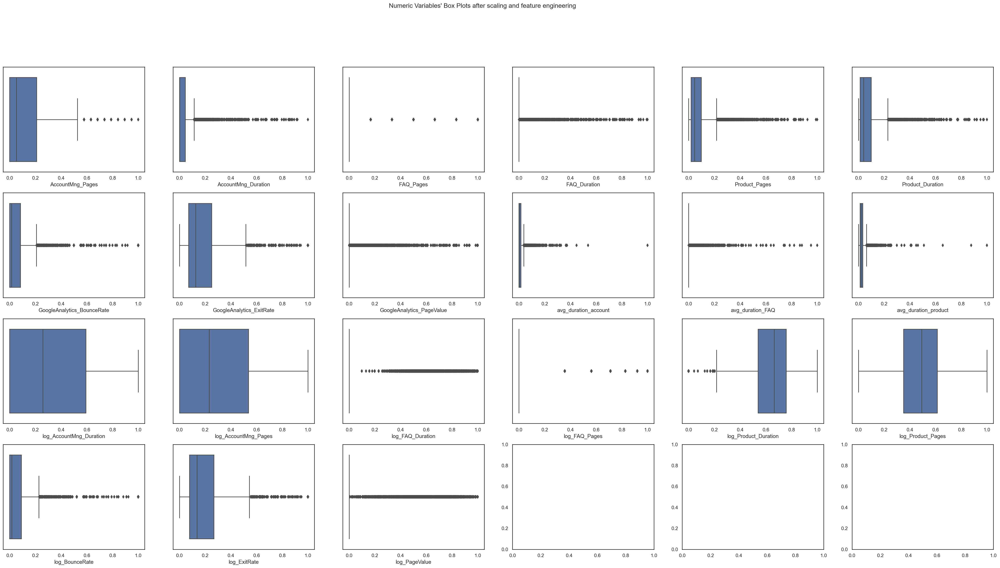

In [131]:

# %matplotlib inline
# sns.set_theme(style="white")


# fig, axes = plt.subplots(4, ceil(len(X_train_eng[metric_feat].columns.tolist()) / 4), figsize=(40, 20))


# for ax, feat in zip(axes.flatten(), X_train_eng[metric_feat].columns.tolist()):
#     sns.boxplot(x=X_train_eng[feat], ax=ax)
    

# title = "Numeric Variables' Box Plots after scaling and feature engineering"

# plt.suptitle(title)

# plt.show()


<a class="anchor" id="FeatureSelection">
    
# Feature Selection
    
</a>


<a class="anchor" id="univariate">
    
## Univariate analysis
    
</a>

In [132]:
# X_train_eng[metric_feat].var()

AccountMng_Pages              0.028244
AccountMng_Duration           0.007063
FAQ_Pages                     0.030986
FAQ_Duration                  0.008019
Product_Pages                 0.010833
Product_Duration              0.011860
GoogleAnalytics_BounceRate    0.060620
GoogleAnalytics_ExitRate      0.060541
GoogleAnalytics_PageValue     0.010535
avg_duration_account          0.000853
avg_duration_FAQ              0.002458
avg_duration_product          0.001074
log_AccountMng_Duration       0.096379
log_AccountMng_Pages          0.082445
log_FAQ_Duration              0.061763
log_FAQ_Pages                 0.056665
log_Product_Duration          0.046194
log_Product_Pages             0.042416
log_BounceRate                0.061299
log_ExitRate                  0.061001
log_PageValue                 0.061553
dtype: float64

None of the variables is univariate so we don't have to drop any variable, at least according with this method

In [133]:
# # https://scikit-learn.org/stable/modules/feature_selection.html 
# pd.DataFrame(X_train_eng[binary_list].var())

,0
browser1,0.160249
browser2,0.228449
browser3,0.006907
browser4,0.056010
browser5,0.034780
browser6,0.014281
browser7,0.004041
browser8,0.010750
browser10,0.014843
browser11,0.000435


In [134]:
# 0.8*(1-0.8)

0.15999999999999998

<hr>
<a class="anchor" id="filter">
    
## Filter Methods
    
</a>

<hr>
<a class="anchor" id="correlation">
    
### Correlation Matrix
    
</a>

In [135]:
# Dataframe with the dependent and independent variables
all_train_num = X_train_eng[metric_feat].join(y_train_df)

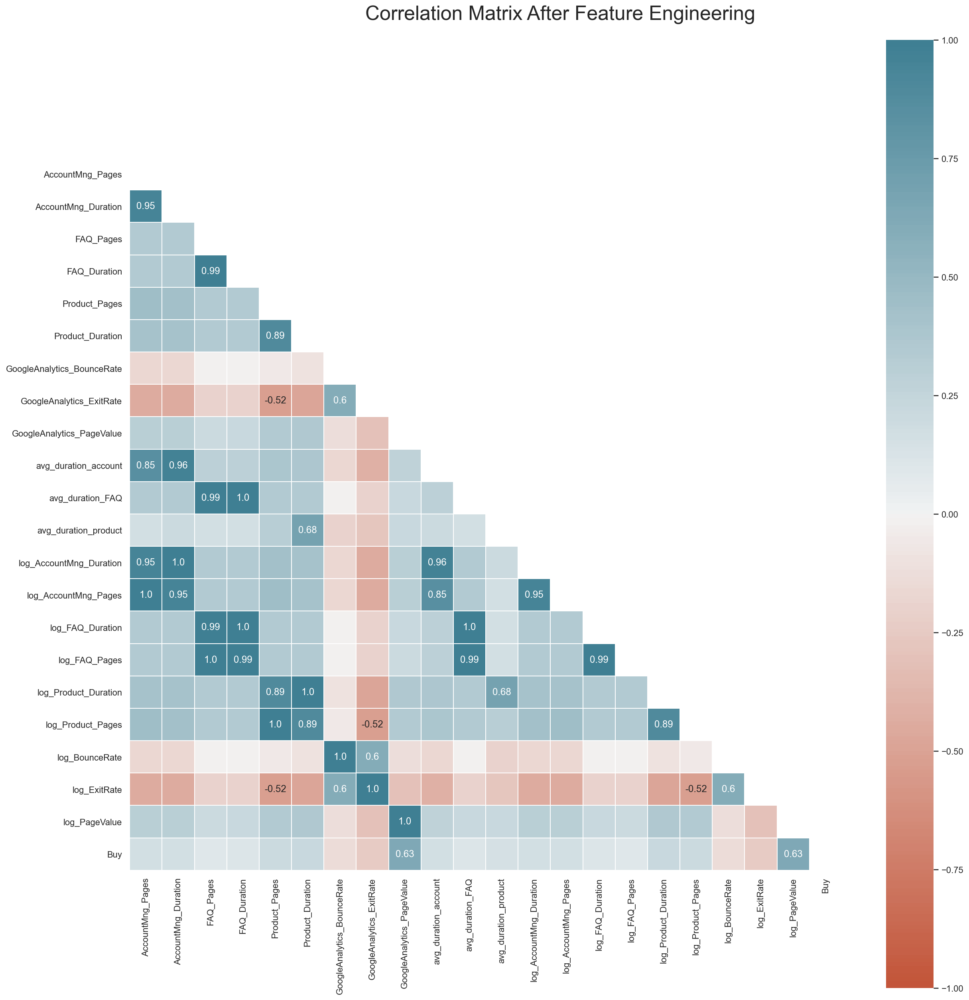

In [136]:

# sns.set_theme(style="white")

# fig = plt.figure(figsize=(20,20))


# corr = np.round(all_train_num.corr(method="spearman"),2)
# matrix = np.triu(corr)

# mask_annot = np.absolute(corr.values) >= 0.5
# annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) 


# sns.heatmap(data=corr, annot=annot,mask=matrix,cmap=sns.diverging_palette(20, 220, n=200), 
#             fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)


# fig.subplots_adjust(top=0.95)
# fig.suptitle("Correlation Matrix After Feature Engineering", fontsize=25)


# plt.show()

GoogleAnalytics_PageValue and log_PageValue are highly correlated with the target variable so we should keep them one of them since they are redundant.

- There are pairs of variables highly correlated, namely:
    - avg_duration_account vs AccountMng_Pages (0.9) <br>
    - avg_duration_account vs AccountMng_Duration (1) <br>
    - log_AccountMng_Duration vs AccountMng_Pages (0.9) <br>
    - log_FAQ_Duration vs FAQ_Pages (1) <br>
    - log_FAQ_Pages vs FAQ_Duration (1) <br>
    - log_Product_Duration vs Product_Pages (0.9) <br>
    - log_Product_Pages vs Product_Duration (0.9) <br>
    - log_BounceRate vs GoogleAnalytics_ExitRate (0.5) <br>
    - log_ExitRate vs GoogleAnalytics_BounceRate (0.9) <br>

<hr>
<a class="anchor" id="chi-squared">
    
### Chi-Squared
    
</a>

In [137]:
# X_chisquare=X_train_eng[binary_list]

In [138]:
# def TestIndependence(X,y,var,alpha=0.05):        
#     dfObserved = pd.crosstab(y,X) 
#     chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
#     dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
#     if p<alpha:
#         result="{0} is IMPORTANT for Prediction".format(var)
#     else:
#         result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
#     print(result)

In [139]:
# for var in X_chisquare.columns.to_list():
#     TestIndependence(X_chisquare[var].squeeze(),y_train_df.squeeze(), var)

browser1 is NOT an important predictor. (Discard browser1 from model)
browser2 is NOT an important predictor. (Discard browser2 from model)
browser3 is NOT an important predictor. (Discard browser3 from model)
browser4 is NOT an important predictor. (Discard browser4 from model)
browser5 is NOT an important predictor. (Discard browser5 from model)
browser6 is IMPORTANT for Prediction
browser7 is NOT an important predictor. (Discard browser7 from model)
browser8 is NOT an important predictor. (Discard browser8 from model)
browser10 is NOT an important predictor. (Discard browser10 from model)
browser11 is NOT an important predictor. (Discard browser11 from model)
browser12 is NOT an important predictor. (Discard browser12 from model)
browser13 is NOT an important predictor. (Discard browser13 from model)
x1_Brazil is NOT an important predictor. (Discard x1_Brazil from model)
x1_France is NOT an important predictor. (Discard x1_France from model)
x1_Germany is NOT an important predictor.

<hr>
<a class="anchor" id="ANOVA">
    
### ANOVA
    
</a>

In [82]:
# def select_features(X_train, y_train):
#     fs = SelectKBest(score_func=f_classif, k='all')
#     fs.fit(X_train, y_train)
    
#     X_train_fs = pd.DataFrame(fs.transform(X_train))
    
#     return X_train_fs, fs

In [83]:
# select_features(X_train_eng[metric_feat], y_train_df)

(            0         1         2         3         4         5       6   \
 0     0.000000  0.000000  0.166667  0.055564  0.113757  0.077643  0.1440   
 1     0.052632  0.009886  0.000000  0.000000  0.264550  0.237173  0.0305   
 2     0.210526  0.107700  0.000000  0.000000  0.082011  0.109229  0.0000   
 3     0.000000  0.000000  0.000000  0.000000  0.007937  0.006723  0.0000   
 4     0.000000  0.000000  0.000000  0.000000  0.023810  0.023290  0.0000   
 ...        ...       ...       ...       ...       ...       ...     ...   
 6897  0.000000  0.000000  0.000000  0.000000  0.026455  0.005722  0.0000   
 6898  0.052632  0.002601  0.000000  0.000000  0.018519  0.002401  0.5715   
 6899  0.315789  0.047607  0.000000  0.000000  0.023810  0.007923  0.0910   
 6900  0.052632  0.049324  0.000000  0.000000  0.015873  0.015305  0.0000   
 6901  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  1.0000   
 
           7         8         9   ...        11        12        13      

In [84]:
# X_train_fs, fs =select_features(X_train_eng[metric_feat], y_train_df)
# dict_feat={}

# for i in range(len(fs.scores_)):
#     dict_feat[X_train_eng[metric_feat].columns[i]]=fs.scores_[i]
    
# dict(sorted(dict_feat.items(), key=lambda item: item[1]))
 

{'avg_duration_product': 12.687953033760234,
 'avg_duration_FAQ': 18.015782894575583,
 'avg_duration_account': 41.02154557572737,
 'FAQ_Duration': 47.25635776955001,
 'AccountMng_Duration': 59.49608450026434,
 'FAQ_Pages': 65.49977850004322,
 'log_FAQ_Pages': 73.17770179510076,
 'log_FAQ_Duration': 82.86839869685718,
 'AccountMng_Pages': 118.77298575199032,
 'GoogleAnalytics_BounceRate': 155.28753078447173,
 'log_BounceRate': 159.5348836455491,
 'log_AccountMng_Pages': 166.05396589267855,
 'Product_Pages': 180.04931673317103,
 'log_AccountMng_Duration': 187.3621484212587,
 'Product_Duration': 196.62157719603428,
 'log_Product_Duration': 284.1546812449993,
 'log_Product_Pages': 284.2843026478342,
 'GoogleAnalytics_ExitRate': 303.76759812733167,
 'log_ExitRate': 314.9147510870929,
 'GoogleAnalytics_PageValue': 2761.787906506965,
 'log_PageValue': 4667.626885561976}

In [85]:
# for i in range(len(fs.scores_)):
#     print('Feature %d: %f' % (i, fs.scores_[i]))


Feature 0: 118.772986
Feature 1: 59.496085
Feature 2: 65.499779
Feature 3: 47.256358
Feature 4: 180.049317
Feature 5: 196.621577
Feature 6: 155.287531
Feature 7: 303.767598
Feature 8: 2761.787907
Feature 9: 41.021546
Feature 10: 18.015783
Feature 11: 12.687953
Feature 12: 187.362148
Feature 13: 166.053966
Feature 14: 82.868399
Feature 15: 73.177702
Feature 16: 284.154681
Feature 17: 284.284303
Feature 18: 159.534884
Feature 19: 314.914751
Feature 20: 4667.626886


<hr>
<a class="anchor" id="wrapper">
    
## Wrapper Methods
    
</a>

<hr>
<a class="anchor" id="RFE">
    
### RFE
    
</a>

Optimal number of features : 12
Max accuracy: 0.8927837420898529


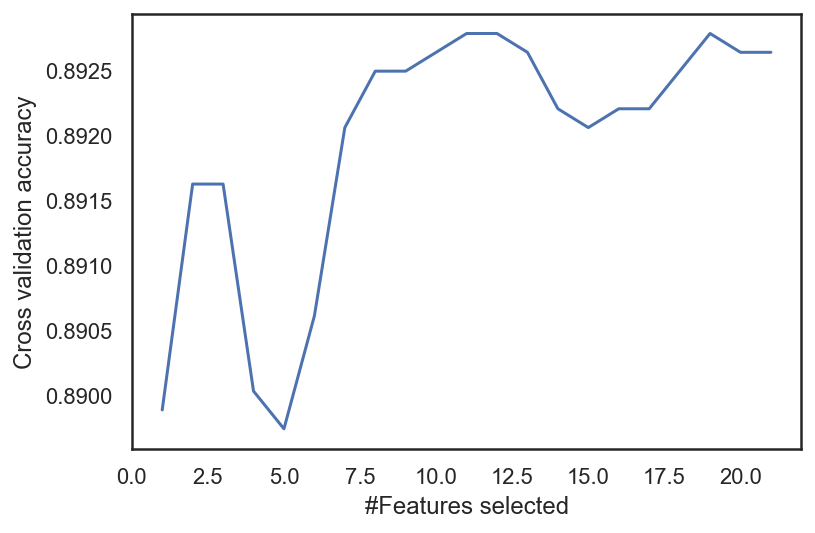

AccountMng_Pages: True
AccountMng_Duration: False
FAQ_Pages: False
FAQ_Duration: False
Product_Pages: True
Product_Duration: True
GoogleAnalytics_BounceRate: True
GoogleAnalytics_ExitRate: True
GoogleAnalytics_PageValue: True
avg_duration_account: True
avg_duration_FAQ: True
avg_duration_product: False
log_AccountMng_Duration: False
log_AccountMng_Pages: False
log_FAQ_Duration: False
log_FAQ_Pages: False
log_Product_Duration: True
log_Product_Pages: False
log_BounceRate: True
log_ExitRate: True
log_PageValue: True


In [88]:
# #Doing the same using RFECV and KFold
# sns.set_theme(style="white")
# min_features_to_select = 1  
# rfecv = RFECV(
#     estimator=LogisticRegression(),
#     step=1,
#     cv=StratifiedKFold(5),
#     scoring="accuracy",
#     min_features_to_select= min_features_to_select
# )
# rfecv.fit(X_train_eng[metric_feat], y_train_df)

# print(f"Optimal number of features : {rfecv.n_features_}")
# print(f"Max accuracy: {np.amax(rfecv.grid_scores_)}" )

# # Plot features vs validation scores
# plt.figure()
# plt.xlabel("#Features selected")
# plt.ylabel("Cross validation accuracy")
# plt.plot(
#     range(min_features_to_select, len(rfecv.grid_scores_) + min_features_to_select),
#     rfecv.grid_scores_,
# )
# plt.show()
# # update version
# rfecv.grid_scores_
# counter = 0
# for column in metric_feat:
#     print(f"{column}: {rfecv.support_[counter]}")
#     counter += 1



In [90]:
# rfecv.support_

array([ True, False, False, False,  True,  True,  True,  True,  True,
        True,  True, False, False, False, False, False,  True, False,
        True,  True,  True])

<hr>
<a class="anchor" id="forward">
    
### Forward Sequential Feature Selection
    
</a>

In [101]:

# ridge_forward = Ridge()
# sfs = SequentialFeatureSelector(ridge_forward, n_features_to_select=15,direction='forward')
# sfs.fit(X_train_eng[metric_feat], y_train_df)

# sfs.get_support()

# teste_forward=sfs.transform(X_train_eng[metric_feat])

In [102]:
# selected_feat_forward = pd.Series(sfs.get_support(), index = X_train_eng[metric_feat].columns)

In [103]:
# pd.set_option('display.max_rows', 100)

# pd.DataFrame(selected_feat_forward)

,0
AccountMng_Pages,True
AccountMng_Duration,True
FAQ_Pages,False
FAQ_Duration,False
Product_Pages,False
Product_Duration,True
GoogleAnalytics_BounceRate,True
GoogleAnalytics_ExitRate,True
GoogleAnalytics_PageValue,True
avg_duration_account,True


<hr>
<a class="anchor" id="forward">
    
### Backward Sequential Feature Selection
    
</a>

In [105]:
# logistic_back = Lasso()
# sfs_back = SequentialFeatureSelector(logistic_back, n_features_to_select=8,direction='backward')
# sfs_back.fit(X_train_eng[metric_feat], y_train_no_out)

# sfs_back.get_support()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True,  True,  True,  True,
        True,  True,  True])

In [107]:
# selected_feat_back = pd.Series(sfs_back.get_support(), index = X_train_eng[metric_feat].columns)
# selected_feat_back

AccountMng_Pages              False
AccountMng_Duration           False
FAQ_Pages                     False
FAQ_Duration                  False
Product_Pages                 False
Product_Duration              False
GoogleAnalytics_BounceRate    False
GoogleAnalytics_ExitRate      False
GoogleAnalytics_PageValue     False
avg_duration_account          False
avg_duration_FAQ              False
avg_duration_product          False
log_AccountMng_Duration       False
log_AccountMng_Pages           True
log_FAQ_Duration               True
log_FAQ_Pages                  True
log_Product_Duration           True
log_Product_Pages              True
log_BounceRate                 True
log_ExitRate                   True
log_PageValue                  True
dtype: bool

<hr>
<a class="anchor" id="embedded">
    
## Embedded Methods
    
</a>


<hr>
<a class="anchor" id="ridge">
    
### Ridge Regression    
</a>

In [108]:
# ridge = Ridge()
# ridge.fit(X_train_eng[metric_feat], y_train_df)

Ridge()

In [109]:
# ridge_coefs = pd.Series(ridge.coef_[0], index = X_train_eng[metric_feat].columns)
# ridge_coefs

AccountMng_Pages             -0.187473
AccountMng_Duration           0.001831
FAQ_Pages                    -0.107193
FAQ_Duration                  0.185134
Product_Pages                 0.115061
Product_Duration              0.277885
GoogleAnalytics_BounceRate    0.046143
GoogleAnalytics_ExitRate     -0.032439
GoogleAnalytics_PageValue    -0.124620
avg_duration_account          0.145421
avg_duration_FAQ             -0.345882
avg_duration_product         -0.078563
log_AccountMng_Duration      -0.012602
log_AccountMng_Pages          0.044895
log_FAQ_Duration              0.002539
log_FAQ_Pages                 0.043777
log_Product_Duration         -0.123686
log_Product_Pages            -0.088450
log_BounceRate               -0.005764
log_ExitRate                 -0.191718
log_PageValue                 0.953801
dtype: float64

In [110]:
# def plot_importance(coef,name):
#     sns.set_theme(style="white")
#     imp_coef = coef.sort_values()
#     plt.figure(figsize=(8,10))
#     imp_coef.plot(kind = "barh")
#     plt.title("Feature importance using " + name + " Model")

#     plt.show()

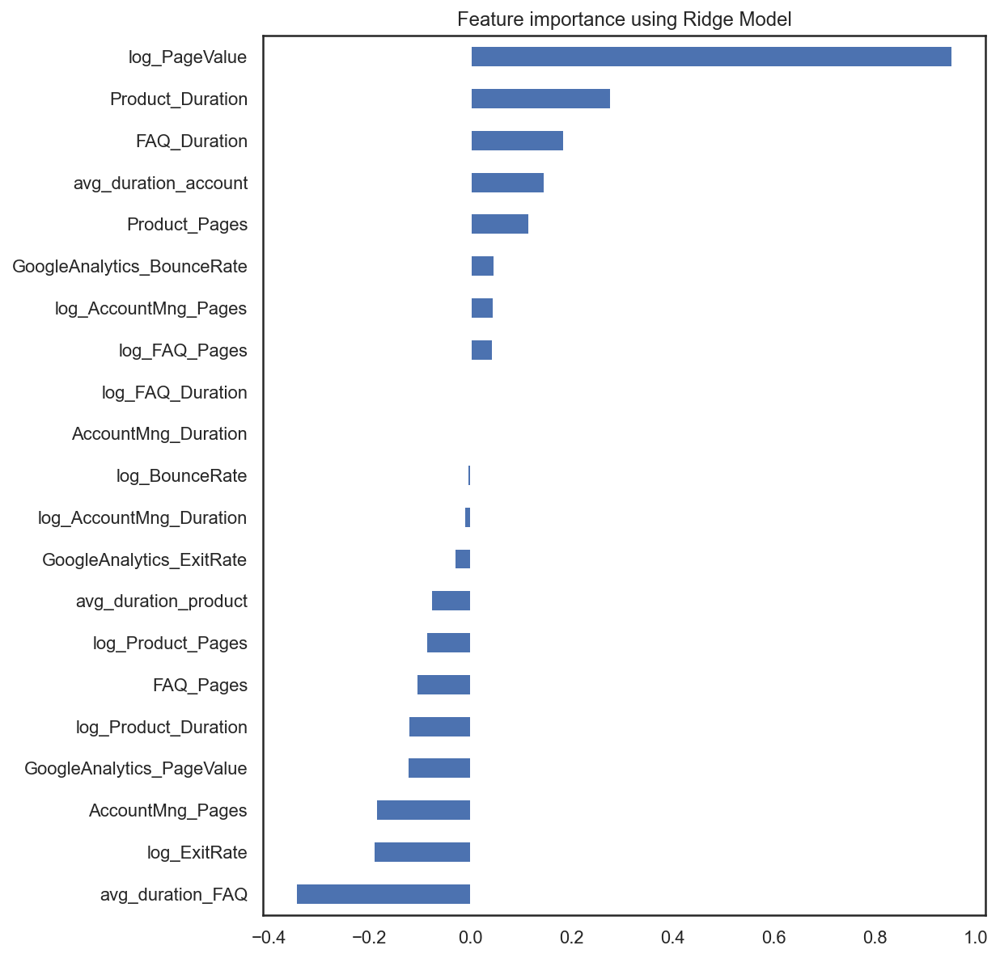

In [111]:
# plot_importance(ridge_coefs,'Ridge')

<hr>
<a class="anchor" id="decision_tree_sel_feature">
    
### Decision Tree for feature importance   
</a>

In [113]:
# gini_importance = DecisionTreeClassifier().fit(X_train_eng[metric_feat+binary_list], y_train_df).feature_importances_
# entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(X_train_eng[metric_feat+binary_list], y_train_df).feature_importances_

Text(0.5, 1.0, 'Feature importance using Decision Tree')

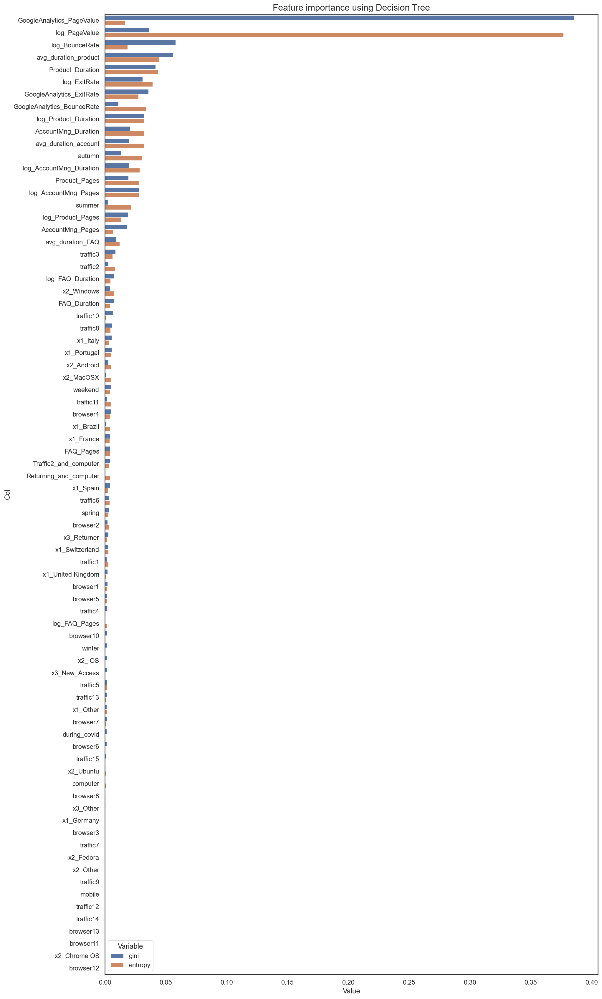

In [114]:

# sns.set_theme(style="white")
# zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
# zippy['col'] = X_train_eng[metric_feat+binary_list].columns
# tidy = zippy.melt(id_vars='col').rename(columns=str.title)
# tidy.sort_values(['Value'], ascending = False, inplace = True)

# plt.figure(figsize=(15,30))
# sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)
# plt.title("Feature importance using Decision Tree",fontsize=15)

<hr>
<a class="anchor" id="imbalanced">
    
# Check for an imbalanced dataset
    
</a>

<hr>
<a class="anchor" id="Adaptive">
    
## SMOTENC 
    
</a>

In [252]:
# X_train_eng=X_train_eng.drop(non_num_feat+['weekday','month'],axis=1)
# X_val_eng=X_val_eng.drop(non_num_feat+['weekday','month'],axis=1)

In [253]:
# y_val_df=y_val_df.squeeze().to_list()
# y_train_df=y_train_df.squeeze().to_list()

In [254]:
# smote_nc = SMOTENC(categorical_features=range(21,78), random_state=42)
# X_train_over, y_train_over = smote_nc.fit_resample(X_train_eng[metric_feat+binary_list], y_train_df)

In [255]:
set1=['AccountMng_Pages','Product_Duration','log_PageValue','x3_New_Access','traffic2','during_covid']
set2=['AccountMng_Pages','Product_Duration','log_PageValue','x3_New_Access','traffic2','during_covid','GoogleAnalytics_ExitRate','log_FAQ_Pages']
set3=['AccountMng_Pages','Product_Duration','log_PageValue','x2_MacOSX','x2_Windows','during_covid','GoogleAnalytics_ExitRate','log_FAQ_Pages']

set1_no_bin=['AccountMng_Pages','Product_Duration','log_PageValue','GoogleAnalytics_ExitRate','log_FAQ_Pages']

sets=[set1, set2, set3,set1_no_bin]

large_set_new = ['log_PageValue','log_Product_Duration', 'log_AccountMng_Duration', 'GoogleAnalytics_BounceRate', 
'autumn', 'GoogleAnalytics_ExitRate', 'log_Product_Pages', 'summer', 'weekend', 'log_AccountMng_Pages', 'avg_duration_FAQ', 'computer']

In [250]:
set_new1=['AccountMng_Pages','Product_Duration','log_PageValue','GoogleAnalytics_ExitRate','log_FAQ_Pages','summer','Returning_and_computer','weekend']
set_new2=['AccountMng_Pages','Product_Duration','log_PageValue','GoogleAnalytics_ExitRate','log_FAQ_Pages','Traffic2_and_computer','Returning_and_computer','winter']
sets_to_test = [set1,set2,set3,set1_no_bin, large_set_new]
sets_to_test2 = [set1,set2,set3,set1_no_bin,set_new1,set_new2, large_set_new]

In [159]:
def metrics1(y_train, pred_train , y_val, pred_val):
    print('___________________________________________________________________________________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print('Confusion Matrix:')
    print(confusion_matrix(y_train, pred_train))


    print('___________________________________________________________________________________________________________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print('Confusion Matrix:')
    print(confusion_matrix(y_val, pred_val))
    
    print('F1 Train: '+str(f1_score(y_train, pred_train)))
    print('F1 Val: '+str(f1_score(y_val, pred_val)))

    return f1_score(y_train, pred_train), f1_score(y_val, pred_val)

## Strafified kfold

In [143]:
def evaluate_model(model, X, y):
    X = X.to_numpy()
    y=np.asarray(y)
    y_=y.astype('float')
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores_f1 = cross_val_score(model, X, y, scoring=make_scorer(f1_score, average='binary'), cv=cv, n_jobs=-1)
    print('F1 score: %.3f (%.3f)' % (np.mean(scores_f1), np.std(scores_f1)))
    return np.mean(scores_f1)

In [144]:
def f1_special(model,X,y,t):
    X = X.to_numpy()
    
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    y=np.asarray(y)
    y=y.astype('float')
    mean_auc=[]
    pred_proba=[]
    y_real=[]
    y_proba=[]
    for i, (train_index, test_index) in enumerate(cv.split(X,y)):
            Xtrain, Xtest = X[train_index], X[test_index]
            ytrain, ytest = y[train_index], y[test_index]
            model.fit(Xtrain, ytrain)
            pred_proba = model.predict_proba(Xtest)
            pred_proba = np.where(pred_proba[:,1] > t, 1, 0)
            y_real.append(ytest)
            y_proba.append(pred_proba)
    y_real = np.concatenate(y_real)
    y_proba = np.concatenate(y_proba)
    return f1_score(y_real, y_proba, average='binary')
    

<hr>
<a class="anchor" id="DT">
    
## Decision Tree
    
</a>

#### Dataset with outliers for DT

In [123]:
# for i in sets_to_test2:
#     print('set: '+str(i))
#     dt_out = DecisionTreeClassifier(splitter = 'random',class_weight='balanced', min_samples_split=500, criterion='gini').fit(X_train_out_robust[i], y_train_out)
#     metrics1(y_train_out, dt_out.predict(X_train_out_robust[i]), y_val_out, dt_out.predict(X_val_out_robust[i]))


set: ['AccountMng_Pages', 'Product_Duration', 'log_PageValue', 'x3_New_Access', 'traffic2', 'during_covid']
___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5913
           1       0.57      0.81      0.67      1086

    accuracy                           0.87      6999
   macro avg       0.76      0.85      0.79      6999
weighted avg       0.90      0.87      0.88      6999

Confusion Matrix:
[[5240  673]
 [ 208  878]]
___________________________________________________________________________________________________________
                                                VALIDATION                              

In [256]:
# dt_out = DecisionTreeClassifier(splitter = 'random', min_samples_split=500,class_weight='balanced', criterion='gini',random_state=4).fit(X_train_out_robust[set2], y_train_out)

In [125]:
# metrics1(y_train_out, dt_out.predict(X_train_out_robust[set2]) , y_val_out, dt_out.predict(X_val_out_robust[set2]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5913
           1       0.57      0.79      0.66      1086

    accuracy                           0.88      6999
   macro avg       0.77      0.84      0.79      6999
weighted avg       0.90      0.88      0.88      6999

Confusion Matrix:
[[5279  634]
 [ 232  854]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6635586635586637, 0.6499102333931778)

In [126]:
# evaluate_model(DecisionTreeClassifier(splitter = 'random', min_samples_split=500, class_weight='balanced', criterion='gini',random_state=4), X_train_out_robust[set1], y_train_out)

F1 score: 0.644 (0.037)


0.6441572014697589

#### DT dataset without outliers

In [128]:
# min_samples_split=[200,300,350,400,450,500,550,600]
# for i in sets_to_test2:
#     print('set: '+str(i))
#     dt = DecisionTreeClassifier(splitter = 'random', class_weight='balanced', min_samples_split=450, criterion='gini',random_state=42).fit(X_train_eng[i], y_train_df)
#     metrics1(y_train_df, dt.predict(X_train_eng[i]) , y_val_df, dt.predict(X_val_eng[i]))

set: ['AccountMng_Pages', 'Product_Duration', 'log_PageValue', 'x3_New_Access', 'traffic2', 'during_covid']
___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.87      0.92      5849
           1       0.54      0.83      0.65      1053

    accuracy                           0.86      6902
   macro avg       0.75      0.85      0.78      6902
weighted avg       0.90      0.86      0.87      6902

Confusion Matrix:
[[5094  755]
 [ 184  869]]
___________________________________________________________________________________________________________
                                                VALIDATION                              

In [145]:
# dt = DecisionTreeClassifier(splitter = 'random', min_samples_split=450,class_weight='balanced', criterion='gini',random_state=4).fit(X_train_eng[set3], y_train_df)
# model_DT=DecisionTreeClassifier(splitter = 'random', min_samples_split=450,class_weight='balanced', criterion='gini',random_state=4)

In [130]:
# metrics1(y_train_df, dt.predict(X_train_eng[set3]) , y_val_df, dt.predict(X_val_eng[set3]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5849
           1       0.57      0.80      0.66      1053

    accuracy                           0.88      6902
   macro avg       0.76      0.85      0.79      6902
weighted avg       0.90      0.88      0.88      6902

Confusion Matrix:
[[5200  649]
 [ 207  846]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6640502354788068, 0.6538461538461539)

In [133]:
# f1_DT=evaluate_model(DecisionTreeClassifier(splitter = 'random', min_samples_split=450, class_weight='balanced', criterion='gini',random_state=4), X_train_eng[set3], y_train_df)

F1 score: 0.656 (0.025)


#### DT WITH OVERSAMPLING

In [138]:
# for i in min_samples_split:
#     print('set: '+str(i))
#     dt_over = DecisionTreeClassifier(splitter = 'random', min_samples_split=i, criterion='gini').fit(X_train_over[set3], y_train_over)
#     metrics1(y_train_over, dt_over.predict(X_train_over[set3]) , y_val_df, dt_over.predict(X_val_eng[set3]))

set: 200
___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.86      0.86      5849
           1       0.86      0.87      0.86      5849

    accuracy                           0.86     11698
   macro avg       0.86      0.86      0.86     11698
weighted avg       0.86      0.86      0.86     11698

Confusion Matrix:
[[5031  818]
 [ 783 5066]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
-------------------------------------------------------------------------------

In [257]:
# dt_over = DecisionTreeClassifier(splitter = 'random',criterion='gini',min_samples_split=400,random_state=42).fit(X_train_over[set1_no_bin], y_train_over)

In [140]:
# metrics1(y_train_over, dt_over.predict(X_train_over[set1_no_bin]) , y_val_df, dt_over.predict(X_val_eng[set1_no_bin]))
# # it is overfitting

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.89      0.86      5849
           1       0.88      0.83      0.85      5849

    accuracy                           0.86     11698
   macro avg       0.86      0.86      0.86     11698
weighted avg       0.86      0.86      0.86     11698

Confusion Matrix:
[[5215  634]
 [1022 4827]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.8535809018567639, 0.6596675415573052)

<hr>
<a class="anchor" id="NN">
    
## Neural Network
    
</a>

In [141]:
# for i in range(len(sets_to_test2)):
    
#     print(f'Scores using Set {i+1}')

#     neural_network = MLPClassifier(max_iter=100).fit(X_train_eng[sets_to_test2[i]], y_train_df)
    
#     predictions_train = neural_network.predict(X_train_eng[sets_to_test2[i]])
#     predictions_val = neural_network.predict(X_val_eng[sets_to_test2[i]])
    
#     metrics1(y_train_df, predictions_train , y_val_df, predictions_val)

Scores using Set 1
___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      5849
           1       0.69      0.59      0.63      1053

    accuracy                           0.90      6902
   macro avg       0.81      0.77      0.79      6902
weighted avg       0.89      0.90      0.89      6902

Confusion Matrix:
[[5565  284]
 [ 433  620]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
---------------------------------------------------------------------

### NN Oversampling

In [145]:
# for i in range(len(sets_to_test2)):
    
#     print(f'Scores using Set {i+1}')

#     neural_network = MLPClassifier(hidden_layer_sizes = (10,10)).fit(X_train_eng[sets_to_test2[i]], y_train_df)
    
#     predictions_train = neural_network.predict(X_train_eng[sets_to_test2[i]])
#     predictions_val = neural_network.predict(X_val_eng[sets_to_test2[i]])

#     metrics1(y_train_df, predictions_train , y_val_df, predictions_val)

Scores using Set 1
___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      5849
           1       0.69      0.59      0.64      1053

    accuracy                           0.90      6902
   macro avg       0.81      0.77      0.79      6902
weighted avg       0.89      0.90      0.89      6902

Confusion Matrix:
[[5575  274]
 [ 430  623]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
---------------------------------------------------------------------

In [147]:
# metrics1(y_train_over, neural_network.predict(X_train_over[large_set_new]), y_val_df, neural_network.predict(X_val_eng[large_set_new]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.72      0.95      0.82      5849
           1       0.93      0.63      0.75      5849

    accuracy                           0.79     11698
   macro avg       0.83      0.79      0.79     11698
weighted avg       0.83      0.79      0.79     11698

Confusion Matrix:
[[5572  277]
 [2160 3689]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.7517065715741212, 0.6269662921348315)

#### NN No oversampling

Neural networks gridsearch for imbalanced dataset

In [148]:
# mlp = MLPClassifier(random_state = 42)

In [149]:
#  parameter_space = {
#      'hidden_layer_sizes': [(12,12), (12,12,12), (10,10,10), (10,10),(5,5),(5,5,5)],
#      'activation': ['tanh', 'relu', 'logistic'],
#      'solver': ['adam', 'lbfgs', 'sgd'],
#      'alpha': [0.1, 0.001, 0.01, 0.0001,0.005],
#      'learning_rate': ['adaptive', 'invscaling'],
#      'max_iter' : [100,250,500,750]
#  }

In [143]:
# clf = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=3,scoring=make_scorer(f1_score, average='binary'))
# clf.fit(X_train_eng[set3], y_train_df)
# clf.predict(X_train_eng[set3])
# clf.predict(X_val_eng[set3])

array([0, 1, 0, ..., 0, 0, 0])

In [144]:
# # Best parameter set
# print('Best parameters found:\n', clf.best_params_)

# print('---------------------------------------------------------------------------------------------------------------------')
# # All results
# means = clf.cv_results_['mean_test_score']
# stds = clf.cv_results_['std_test_score']
# for mean, std, params in zip(means, stds, clf.cv_results_['params']):
#     print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

Best parameters found:
 {'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': (5, 5, 5), 'learning_rate': 'adaptive', 'max_iter': 250, 'solver': 'adam'}
---------------------------------------------------------------------------------------------------------------------
0.618 (+/-0.027) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'adam'}
0.608 (+/-0.044) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'lbfgs'}
0.595 (+/-0.026) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'sgd'}
0.608 (+/-0.059) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 250, 'solver': 'adam'}
0.622 (+/-0.039) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_r

In [150]:
# neural_network_reg = MLPClassifier(random_state = 42, activation = 'logistic', alpha = 0.0001, hidden_layer_sizes = (5,5,5), learning_rate = 'adaptive', solver = 'adam', max_iter = 250).fit(X_train_eng[set3], y_train_df)

In [107]:
# evaluate_model(neural_network_reg, X_train_eng[set3], y_train_df)

F1 score: 0.649 (0.037)


In [151]:
# metrics1(y_train_df, neural_network_reg.predict(X_train_eng[set3]), y_val_df, neural_network_reg.predict(X_val_eng[set3]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      5849
           1       0.68      0.62      0.65      1053

    accuracy                           0.90      6902
   macro avg       0.81      0.78      0.80      6902
weighted avg       0.89      0.90      0.90      6902

Confusion Matrix:
[[5546  303]
 [ 400  653]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6500746640119462, 0.6445916114790287)

In [144]:
# MLPClassifier(random_state = 42, activation = 'logistic', alpha = 0.0001, hidden_layer_sizes = (5,5,5), learning_rate = 'adaptive', solver = 'adam', max_iter = 250)

In [152]:
# mlp_large = MLPClassifier(random_state = 42)

In [153]:
#  parameter_space_large_set = {
#      'hidden_layer_sizes': [(12,12), (12,12,12), (10,10,10), (10,10),(8,8,8),(5,5,5)],
#      'activation': ['tanh', 'relu', 'logistic'],
#      'solver': ['adam', 'lbfgs', 'sgd'],
#      'alpha': [0.1, 0.001, 0.01, 0.0001,0.005],
#      'learning_rate': ['adaptive', 'invscaling'],
#      'max_iter' : [100,250,500,750]
#  }

In [207]:
# clf = GridSearchCV(mlp_large, parameter_space_large_set, n_jobs=-1, cv=3,scoring=make_scorer(f1_score, average='binary'))
# clf.fit(X_train_eng[large_set_new], y_train_df)
# clf.predict(X_train_eng[large_set_new])
# clf.predict(X_val_eng[large_set_new])

array([0, 1, 0, ..., 0, 0, 0])

In [208]:
# # Best parameter set
# print('Best parameters found:\n', clf.best_params_)

# print('---------------------------------------------------------------------------------------------------------------------')
# # All results
# means = clf.cv_results_['mean_test_score']
# stds = clf.cv_results_['std_test_score']
# for mean, std, params in zip(means, stds, clf.cv_results_['params']):
#     print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

Best parameters found:
 {'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': (8, 8, 8), 'learning_rate': 'adaptive', 'max_iter': 250, 'solver': 'adam'}
---------------------------------------------------------------------------------------------------------------------
0.610 (+/-0.023) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'adam'}
0.627 (+/-0.019) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'lbfgs'}
0.610 (+/-0.021) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'sgd'}
0.626 (+/-0.027) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 250, 'solver': 'adam'}
0.622 (+/-0.039) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_r

In [146]:
# model_NN = MLPClassifier(random_state = 42, activation = 'logistic', alpha = 0.0001, solver = 'adam', max_iter = 250, hidden_layer_sizes=(8,8,8)).fit(X_train_eng[large_set_new], y_train_df)

In [201]:
# evaluate_model(model_NN, X_train_eng[large_set_new], y_train_df)

F1 score: 0.658 (0.038)


In [203]:
# metrics1(y_train_df, model_NN.predict(X_train_eng[large_set_new]), y_val_df, model_NN.predict(X_val_eng[large_set_new]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      5849
           1       0.69      0.62      0.65      1053

    accuracy                           0.90      6902
   macro avg       0.81      0.78      0.80      6902
weighted avg       0.89      0.90      0.90      6902

Confusion Matrix:
[[5552  297]
 [ 402  651]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6506746626686656, 0.6421404682274248)

Neural network gridsearch oversampling

In [169]:
# mlp_over = MLPClassifier(random_state = 42)

In [170]:
# parameter_space = {
#     'hidden_layer_sizes': [(12,12), (12,12,12), (15,12,12), (12,15,12)],
#     'activation': ['tanh', 'relu', 'logistic'],
#     'solver': ['adam', 'lbfgs', 'sgd'],
#     'alpha': [0.0001, 0.001, 0.00001],
#     'learning_rate': ['adaptive', 'invscaling'],
# }

In [171]:
# clf = GridSearchCV(mlp_over, parameter_space, n_jobs=-1, cv=3)
# clf.fit(X_train_over[set2], y_train_over)
# clf.predict(X_train_over[set2])
# clf.predict(X_val_eng[set2])

In [172]:
# # Best parameter set
# print('Best parameters found:\n', clf.best_params_)

# print('---------------------------------------------------------------------------------------------------------------------')
# # All results
# means = clf.cv_results_['mean_test_score']
# stds = clf.cv_results_['std_test_score']
# for mean, std, params in zip(means, stds, clf.cv_results_['params']):
#    print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

In [173]:
# neural_network_over = MLPClassifier(random_state = 42, activation= 'tanh', alpha= 1e-05, hidden_layer_sizes= (12, 12), learning_rate= 'adaptive', solver= 'lbfgs').fit(X_train_over[set2], y_train_over)

### Neural Network Outliers 

In [147]:
# mlp_out = MLPClassifier(random_state = 42)

In [148]:
#  parameter_space = {
#      'hidden_layer_sizes': [(12,12), (12,12,12), (10,10,10), (10,10),(5,5),(5,5,5)],
#      'activation': ['tanh', 'relu', 'logistic'],
#      'solver': ['adam', 'lbfgs', 'sgd'],
#      'alpha': [0.1, 0.001, 0.01, 0.0001,0.005],
#      'learning_rate': ['adaptive', 'invscaling'],
#      'max_iter' : [100,250,500,750]
#  }

In [149]:
# clf_out = GridSearchCV(mlp_out, parameter_space, n_jobs=-1, cv=3,scoring=make_scorer(f1_score, average='binary'))
# clf_out.fit(X_train_out_robust[large_set_new], y_train_out)
# clf_out.predict(X_train_out_robust[large_set_new])
# clf_out.predict(X_val_out_robust[large_set_new])

array([0, 1, 0, ..., 0, 0, 1])

In [ ]:
# # Best parameter set
# print('Best parameters found:\n', clf_out.best_params_)

# print('---------------------------------------------------------------------------------------------------------------------')
# # All results
# means = clf_out.cv_results_['mean_test_score']
# stds = clf_out.cv_results_['std_test_score']
# for mean, std, params in zip(means, stds, clf_out.cv_results_['params']):
#     print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

Best parameters found:
 {'activation': 'logistic', 'alpha': 0.001, 'hidden_layer_sizes': (10, 10, 10), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'adam'}
---------------------------------------------------------------------------------------------------------------------
0.647 (+/-0.023) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'adam'}
0.628 (+/-0.034) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'lbfgs'}
0.633 (+/-0.014) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'sgd'}
0.639 (+/-0.031) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning_rate': 'adaptive', 'max_iter': 500, 'solver': 'adam'}
0.584 (+/-0.034) for {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (12, 12), 'learning

In [151]:
# neural_network_out = MLPClassifier(random_state = 42, activation = 'logistic', alpha = 0.001, hidden_layer_sizes=(10,10,10), learning_rate = 'adaptive', max_iter = 100, solver = 'adam').fit(X_train_out_robust[large_set_new], y_train_out)

In [158]:
# metrics1(y_train_out, neural_network_out.predict(X_train_out_robust[large_set_new]), y_val_out, neural_network_out.predict(X_val_out_robust[large_set_new]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.93      0.94      5913
           1       0.65      0.68      0.67      1086

    accuracy                           0.89      6999
   macro avg       0.80      0.81      0.80      6999
weighted avg       0.90      0.89      0.89      6999

Confusion Matrix:
[[5516  397]
 [ 346  740]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6657669815564552, 0.6558375634517767)

In [161]:
# evaluate_model(neural_network_out, X_train_out_robust[large_set_new], y_train_out)

F1 score: 0.665 (0.031)


0.664773022234962

In [152]:
# f1_NN = evaluate_model(neural_network_out, X_train_out_robust[large_set_new], y_train_out)
# model_NN_out = neural_network_out

F1 score: 0.665 (0.031)


<hr>
<a class="anchor" id="LR">
    
## Logistic Regression
    
</a>

### Without oversampling

In [163]:
# print('Scores with Sets list')
# for i in range(len(sets_to_test2)):
    
#     print(f'Scores using Set {i+1}')

#     logistic_regression = LogisticRegression(class_weight='balanced').fit(X_train_eng[sets_to_test2[i]], y_train_df)
    
#     predict_train_log = logistic_regression.predict(X_train_eng[sets_to_test2[i]])
#     predict_val_log = logistic_regression.predict(X_val_eng[sets_to_test2[i]])
    
    
#     metrics1(y_train_df, predict_train_log , y_val_df, predict_val_log)

Scores with Sets list
Scores using Set 1
___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5849
           1       0.56      0.78      0.65      1053

    accuracy                           0.87      6902
   macro avg       0.76      0.84      0.79      6902
weighted avg       0.90      0.87      0.88      6902

Confusion Matrix:
[[5214  635]
 [ 233  820]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
-----------------------------------------------

In [164]:
# logistic_regression = LogisticRegression(class_weight='balanced').fit(X_train_eng[set_new2], y_train_df)
    
# predict_train_log = logistic_regression.predict(X_train_eng[set_new2])
# predict_val_log = logistic_regression.predict(X_val_eng[set_new2])
    
    
# metrics1(y_train_df, predict_train_log , y_val_df, predict_val_log)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5849
           1       0.57      0.78      0.66      1053

    accuracy                           0.88      6902
   macro avg       0.76      0.84      0.79      6902
weighted avg       0.90      0.88      0.88      6902

Confusion Matrix:
[[5222  627]
 [ 232  821]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6565373850459816, 0.6607773851590107)

In [165]:
# evaluate_model(LogisticRegression(class_weight='balanced'), X_train_eng[set_new2], y_train_df)

F1 score: 0.658 (0.025)


0.6580431618347902

#### Grid Search

In [130]:
# model = LogisticRegression(class_weight='balanced')
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# space = dict()
# space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
# space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
# space['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]

In [131]:
# search = GridSearchCV(model, space, scoring = make_scorer(f1_score, average='binary'), n_jobs=-1, cv=cv)
# result = search.fit(X_train_eng[set_new2], y_train_df)
# # summarize result
# print('Best Score: %s' % result.best_score_)
# print('----------------------------------------------')
# print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.6640667416840748
----------------------------------------------
Best Hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}


#### Logistic Regression with Optimized Hyperparameters

In [166]:
# log_reg_gs = LogisticRegression(C = 0.01, penalty = 'l1', solver = 'liblinear', class_weight='balanced').fit(X_train_eng[set_new2], y_train_df)
    
# pred_train_log_gs = log_reg_gs.predict(X_train_eng[set_new2])
# pred_val_log_gs = log_reg_gs.predict(X_val_eng[set_new2])
    
    
# metrics1(y_train_df, pred_train_log_gs , y_val_df, pred_val_log_gs)


___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      5849
           1       0.58      0.77      0.66      1053

    accuracy                           0.88      6902
   macro avg       0.77      0.84      0.80      6902
weighted avg       0.90      0.88      0.89      6902

Confusion Matrix:
[[5264  585]
 [ 238  815]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6644924582144315, 0.6547085201793722)

#### Changing the threshold

F1-score with 0.0 threshold: 0.2647391577624135
F1-score with 0.01 threshold: 0.2647391577624135
F1-score with 0.02 threshold: 0.2647391577624135
F1-score with 0.03 threshold: 0.2647391577624135
F1-score with 0.04 threshold: 0.2647391577624135
F1-score with 0.05 threshold: 0.2647391577624135
F1-score with 0.06 threshold: 0.2647391577624135
F1-score with 0.07 threshold: 0.2647391577624135
F1-score with 0.08 threshold: 0.2647391577624135
F1-score with 0.09 threshold: 0.2647391577624135
F1-score with 0.1 threshold: 0.2647391577624135
F1-score with 0.11 threshold: 0.2647391577624135
F1-score with 0.12 threshold: 0.2647391577624135
F1-score with 0.13 threshold: 0.2647391577624135
F1-score with 0.14 threshold: 0.2647391577624135
F1-score with 0.15 threshold: 0.2647391577624135
F1-score with 0.16 threshold: 0.2647391577624135
F1-score with 0.17 threshold: 0.2647391577624135
F1-score with 0.18 threshold: 0.2647391577624135
F1-score with 0.19 threshold: 0.26702168124762266
F1-score with 0.2 thr

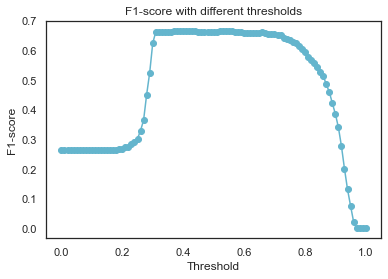

In [141]:
# clf = LogisticRegression(C = 0.01, penalty = 'l1', solver = 'liblinear', class_weight='balanced')
# clf.fit(X_train_eng[set_new2], y_train_df)

# f1_scores = []
# max_f1 = 0
# best_threshold = 0
# for i in arange(0, 1.01, 0.01):
#       preds = np.where(clf.predict_proba(X_train_eng[set_new2])[:,1] > i, 1, 0)
#       f1_scores.append(f1_score(y_train_df, preds))
#       print(f'F1-score with {i} threshold: {f1_score(y_train_df, preds)}')
#       if f1_score(y_train_df, preds) > max_f1:
#             max_f1 = f1_score(y_train_df, preds)
#             best_threshold = i

# print(f'Best F1-score: {max_f1} (with {best_threshold} threshold)')
# sns.set_theme(style="white")

# plt.plot(arange(0,1.01,0.01), f1_scores, color ='c', marker='o')
# plt.title('F1-score with different thresholds')
# plt.xlabel('Threshold')
# plt.ylabel('F1-score')
# plt.savefig(os.path.join('../techscape-ecommerce/figures', 'threshold_no_out'), dpi=200)


In [168]:
# clf = LogisticRegression(C = 0.01, penalty = 'l1', solver = 'liblinear', class_weight={0:1,1:5.6})
# clf.fit(X_train_eng[set_new2], y_train_df)
# THRESHOLD = 0.55
# preds = np.where(clf.predict_proba(X_test_eng[set_new2])[:,1] > THRESHOLD, 1, 0)

In [169]:
# preds_train = np.where(clf.predict_proba(X_train_eng[set_new2])[:,1] > THRESHOLD, 1, 0)
# preds_val = np.where(clf.predict_proba(X_val_eng[set_new2])[:,1] > THRESHOLD, 1, 0)

# metrics1(y_train_df, preds_train , y_val_df, preds_val)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.90      0.93      5849
           1       0.59      0.76      0.66      1053

    accuracy                           0.88      6902
   macro avg       0.77      0.83      0.80      6902
weighted avg       0.90      0.88      0.89      6902

Confusion Matrix:
[[5289  560]
 [ 253  800]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6630750103605471, 0.6551724137931034)

In [153]:
# model_LR = LogisticRegression(C = 0.01, penalty = 'l1', solver = 'liblinear', class_weight='balanced')

In [171]:
# f1_LR=f1_special(model_LR,X_train_eng[set_new2],y_train_df,0.55)
# f1_LR

0.6674982674982676

#### Dataset with outliers

GridSearch

In [143]:
# model = LogisticRegression(class_weight='balanced')
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# space = dict()
# space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
# space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
# space['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]

In [144]:
# search = GridSearchCV(model, space, scoring = make_scorer(f1_score, average='binary'), n_jobs=-1, cv=cv)
# result = search.fit(X_train_out_robust[set_new2], y_train_out)
# # summarize result
# print('Best Score: %s' % result.best_score_)
# print('----------------------------------------------')
# print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.6641610770738733
----------------------------------------------
Best Hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}


#### Logistic Regression with Optimized Hyperparameters

Best threshold:

F1-score with 0.0 threshold: 0.2686456400742115
F1-score with 0.01 threshold: 0.2686456400742115
F1-score with 0.02 threshold: 0.2686456400742115
F1-score with 0.03 threshold: 0.2686456400742115
F1-score with 0.04 threshold: 0.2686456400742115
F1-score with 0.05 threshold: 0.2826597131681878
F1-score with 0.06 threshold: 0.2830656743700222
F1-score with 0.07 threshold: 0.28395546823837586
F1-score with 0.08 threshold: 0.28530069746019215
F1-score with 0.09 threshold: 0.2869242985706723
F1-score with 0.1 threshold: 0.288031914893617
F1-score with 0.11 threshold: 0.2891888280101564
F1-score with 0.12 threshold: 0.29015821936175923
F1-score with 0.13 threshold: 0.2960328317373462
F1-score with 0.14 threshold: 0.2995704586393238
F1-score with 0.15 threshold: 0.3018446059250978
F1-score with 0.16 threshold: 0.3044826614040034
F1-score with 0.17 threshold: 0.309062185839437
F1-score with 0.18 threshold: 0.313028271640921
F1-score with 0.19 threshold: 0.31642941874258596
F1-score with 0.2 thr

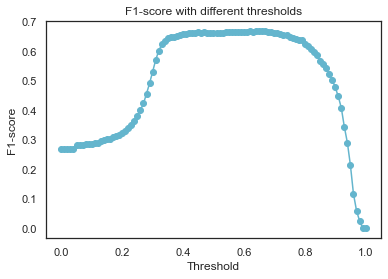

In [153]:
# clf = LogisticRegression(C = 0.01, penalty = 'l1', solver = 'liblinear', class_weight='balanced')
# clf.fit(X_train_out_robust[set_new2], y_train_out)

# f1_scores = []
# max_f1 = 0
# best_threshold = 0
# for i in arange(0, 1.01, 0.01):
#       preds = np.where(clf.predict_proba(X_train_out_robust[set_new2])[:,1] > i, 1, 0)
#       f1_scores.append(f1_score(y_train_out, preds))
#       print(f'F1-score with {i} threshold: {f1_score(y_train_out, preds)}')
#       if f1_score(y_train_out, preds) > max_f1:
#             max_f1 = f1_score(y_train_out, preds)
#             best_threshold = i

# print(f'Best F1-score: {max_f1} (with {best_threshold} threshold)')
# sns.set_theme(style="white")

# plt.plot(arange(0,1.01,0.01), f1_scores, color ='c', marker='o')
# plt.title('F1-score with different thresholds')
# plt.xlabel('Threshold')
# plt.ylabel('F1-score')
# plt.savefig(os.path.join('../techscape-ecommerce/figures', 'threshold_outliers'), dpi=200)

In [288]:
# model_log = LogisticRegression(C = 0.01, penalty = 'l1', solver = 'liblinear', class_weight='balanced')
# model_log.fit(X_train_out_robust[set_new2], y_train_out)
# THRESHOLD = 0.66
# preds = np.where(model_log.predict_proba(X_test_robust[set_new2])[:,1] > THRESHOLD, 1, 0)

In [173]:
# preds_train_out = np.where(model_log.predict_proba(X_train_out_robust[set_new2])[:,1] > THRESHOLD, 1, 0)
# preds_val_out = np.where(model_log.predict_proba(X_val_out_robust[set_new2])[:,1] > THRESHOLD, 1, 0)

# metrics1(y_train_out, preds_train_out , y_val_out, preds_val_out)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.91      0.93      5913
           1       0.61      0.75      0.67      1086

    accuracy                           0.89      6999
   macro avg       0.78      0.83      0.80      6999
weighted avg       0.90      0.89      0.89      6999

Confusion Matrix:
[[5391  522]
 [ 275  811]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6705250103348492, 0.6502369668246447)

In [117]:
# f1_special(model_log,X_train_out_robust[set_new2],y_train_out,0.66)

0.6688760011046673

<hr>
<a class="anchor" id="KNN">
    
## KNN 
    
</a>

In [154]:
# #Outlier X alteration       
# X_train_out_knn = X_train_out_robust[set1_no_bin]
# X_val_out_knn = X_val_out_robust[set1_no_bin]

# #Non-oversampled X alteration
# X_train_eng_knn = X_train_eng[set1_no_bin]
# X_val_eng_knn = X_val_eng[set1_no_bin]

In [155]:
# #GridSearch for non_outlier data

# f1 = make_scorer(f1_score , average='binary')

# grid_params = {
#     "n_neighbors": np.arange(1,16,2),
#     "weights": ["uniform", "distance"],
#     "algorithm": ["kd_tree", "brute", "ball_tree"],
#     "metric": ["euclidean", "manhattan"],
#     "leaf_size": [1,2,3,4,5,6,7,8]
# }

# gs_1 = GridSearchCV(
#     KNeighborsClassifier(),
#     grid_params,
#     verbose=1,
#     cv = 5,
#     n_jobs= -1,
#     scoring = f1
# )

# gs_1_results = gs_1.fit(X_train_eng_knn, y_train_df)

# print("****************************************************")
# print(f"Best Score:{gs_1_results.best_score_}")
# print("****************************************************")
# print(f"Best Results:{gs_1_results.best_params_}")
# print("****************************************************")
# print(f"Scorer:{gs_1_results.scorer_}")

Fitting 5 folds for each of 768 candidates, totalling 3840 fits
****************************************************
Best Score:nan
****************************************************
Best Results:{'algorithm': 'kd_tree', 'leaf_size': 1, 'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
****************************************************
Scorer:make_scorer(f1_score, average=binary)


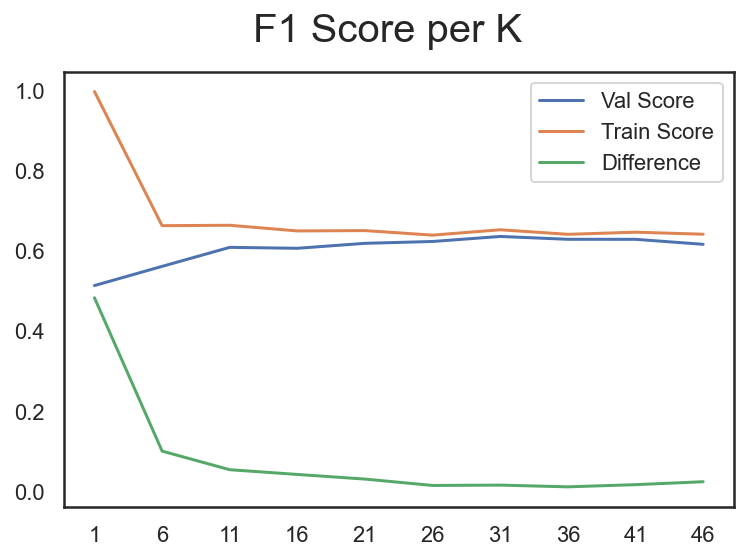

In [176]:
# #Creating model based on results from GridSearch

# nKrange = np.arange(1,50,5)

# val_score_list = []
# train_score_list = []
# difference_list = []

# for k in nKrange:
#     # instantiate the model
#     knn = KNeighborsClassifier(algorithm='kd_tree', leaf_size=1, metric='manhattan',n_neighbors=k, weights="uniform")

#     # fit the model to the training set
#     knn.fit(X_train_eng_knn, y_train_df)

#     #Predicting values
#     y_pred_val = knn.predict(X_val_eng_knn)
#     y_pred_train = knn.predict(X_train_eng_knn)

#     #F1 Scores 
#     val_score = f1_score(y_val_df, y_pred_val)
#     train_score = f1_score(y_train_df, y_pred_train)
#     difference = train_score - val_score

#     #Appending to lists
#     val_score_list.append(val_score)
#     train_score_list.append(train_score)
#     difference_list.append(difference)

# fig = plt.figure()
# fig.suptitle('F1 Score per K', fontsize=20)
# plt.rcParams["figure.figsize"] = (15,7)
# plt.plot(nKrange, val_score_list, label = 'Val Score')
# plt.plot(nKrange, train_score_list, label = 'Train Score')
# plt.plot(nKrange, difference_list, label = "Difference")
# plt.xticks(nKrange)
# plt.legend()
# plt.show()

In [156]:
# #Instantiating final model
# final_knn = KNeighborsClassifier(algorithm='kd_tree', leaf_size=1, metric='manhattan',n_neighbors=46)

# #Fitting model
# final_knn.fit(X_train_eng_knn, y_train_df)

# #Creating prediction on validation set
# y_pred_11 = final_knn.predict(X_val_eng_knn)
# model_KNN = final_knn

In [178]:
# f1_KNN=f1_special(model_KNN,X_train_eng[set1_no_bin],y_train_df,0.35)
# f1_KNN

0.6601431283773915

In [179]:
# #Changing threshold

# predict_train_KNN_threshold = (final_knn.predict_proba(X_train_eng_knn)[:,1] >= 0.35).astype(int)
# predict_val_KNN_threshold = (final_knn.predict_proba(X_val_eng_knn)[:,1] >= 0.35).astype(int)

# metrics1(y_train_df, predict_train_KNN_threshold , y_val_df, predict_val_KNN_threshold)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.92      0.93      5849
           1       0.62      0.73      0.67      1053

    accuracy                           0.89      6902
   macro avg       0.79      0.83      0.80      6902
weighted avg       0.90      0.89      0.89      6902

Confusion Matrix:
[[5381  468]
 [ 284  769]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6716157205240175, 0.6576402321083172)

#### KNN Outliers

In [157]:
# #GridSearch for outliers data

# f1 = make_scorer(f1_score, average='binary')

# grid_params = {
#     "n_neighbors": np.arange(1,16,2),
#     "weights": ["uniform", "distance"],
#     "algorithm": ["kd_tree", "brute", "ball_tree"],
#     "metric": ["euclidean", "manhattan"],
#     "leaf_size": [1,2,3,4,5,6,7,8]
# }

# gs = GridSearchCV(
#     KNeighborsClassifier(),
#     grid_params,
#     verbose=1,
#     cv = 5,
#     n_jobs= -1,
#     scoring = f1,
# )

# gs_results = gs.fit(X_train_out_knn, y_train_out)

# print("****************************************************")
# print(f"Best Score:{gs_results.best_score_}")
# print("****************************************************")
# print(f"Best Results:{gs_results.best_params_}")
# print("****************************************************")
# print(f"Scorer:{gs_results.scorer_}")

Fitting 5 folds for each of 768 candidates, totalling 3840 fits
****************************************************
Best Score:0.6299976640664593
****************************************************
Best Results:{'algorithm': 'kd_tree', 'leaf_size': 1, 'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'uniform'}
****************************************************
Scorer:make_scorer(f1_score, average=binary)


In [160]:
# #Instantiating final model
# final_knn_outliers = KNeighborsClassifier(algorithm='kd_tree', leaf_size=1, metric='euclidean',n_neighbors=11, weights="uniform")

# #Fitting model
# final_knn_outliers.fit(X_train_out_knn, y_train_out)

# #Creating prediction on train set
# pred_out_train = final_knn_outliers.predict(X_train_out_knn)

# #Creating prediction on validation set
# pred_out_val = final_knn_outliers.predict(X_val_out_knn)

# #Displaying metrics
# metrics1(y_train_out, pred_out_train , y_val_out, pred_out_val)

# #Storing evaluation
# f1_KNN_out = evaluate_model(final_knn_outliers, X_train_out_knn, y_train_out)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.96      0.95      5913
           1       0.75      0.62      0.68      1086

    accuracy                           0.91      6999
   macro avg       0.84      0.79      0.81      6999
weighted avg       0.90      0.91      0.91      6999

Confusion Matrix:
[[5692  221]
 [ 411  675]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

<hr>
<a class="anchor" id="SVM">
    
## Support vector machine
    
</a>

In [183]:
# print('Scores with Sets list')
# for i in range(len(sets_to_test2)):
        
#     print(f'Scores using Set {i+1}')

#     svm_no_over = SVC(kernel = 'rbf',class_weight='balanced').fit(X_train_eng[sets_to_test2[i]], y_train_df)
    
#     predict_train_svm = svm_no_over.predict(X_train_eng[sets_to_test2[i]])
#     predict_val_svm = svm_no_over.predict(X_val_eng[sets_to_test2[i]])
    
    
#     metrics1(y_train_df, predict_train_svm , y_val_df, predict_val_svm)

Scores with Sets list
Scores using Set 1
___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5849
           1       0.57      0.80      0.66      1053

    accuracy                           0.88      6902
   macro avg       0.76      0.85      0.79      6902
weighted avg       0.90      0.88      0.88      6902

Confusion Matrix:
[[5207  642]
 [ 209  844]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
-----------------------------------------------

#### Grid search for dataset with outliers

In [ ]:
# param_grid = {'C': [4,5,6,7,8,10,20,25,30], 'gamma': [0.2,0.15,0.1,0.01,0.05,0.001],'kernel': ['rbf', 'sigmoid']}

# grid = GridSearchCV(SVC(class_weight='balanced'),param_grid,refit=True,verbose=2,scoring=make_scorer(f1_score, average='binary'))

# grid_result_out = grid.fit(X_train_out_robust[set1_no_bin], y_train_out)
# # summarize the best score and configuration
# print("Best: %f using %s" % (grid_result_out.best_score_, grid_result_out.best_params_))
# # summarize all scores that were evaluated
# means = grid_result_out.cv_results_['mean_test_score']
# stds = grid_result_out.cv_results_['std_test_score']
# params = grid_result_out.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   2.2s
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   2.4s
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   1.8s
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   2.1s
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   3.4s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   0.8s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   0.9s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   0.8s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   0.7s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   0.8s
[CV] END ........................C=4, gamma=0.15, kernel=rbf; total time=   2.7s
[CV] END ........................C=4, gamma=0.

In [161]:
# svm_out = SVC(class_weight='balanced',C= 20, gamma= 0.001, kernel='sigmoid',random_state=42,probability=True).fit(X_train_out_robust[set1_no_bin], y_train_out)
# metrics1(y_train_out, svm_out.predict(X_train_out_robust[set1_no_bin]) , y_val_out, svm_out.predict(X_val_out_robust[set1_no_bin]))
# evaluate_model(svm_out,X_train_out_robust[set1_no_bin],y_train_out)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      5913
           1       0.58      0.78      0.66      1086

    accuracy                           0.88      6999
   macro avg       0.77      0.84      0.80      6999
weighted avg       0.90      0.88      0.89      6999

Confusion Matrix:
[[5306  607]
 [ 243  843]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

0.6649733161063128

#### Grid search for dataset without outliers

In [ ]:
# param_grid = {'C': [4,5,6,7,8,10,20,25,30], 'gamma': [0.2,0.15,0.1,0.01,0.05,0.001],'kernel': ['rbf', 'sigmoid']}

# grid = GridSearchCV(SVC(class_weight='balanced'),param_grid,refit=True,verbose=2,scoring=make_scorer(f1_score, average='binary'))

# grid_result = grid.fit(X_train_eng[set1_no_bin], y_train_df)

# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   2.9s
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   2.5s
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   2.0s
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   2.3s
[CV] END .........................C=4, gamma=0.2, kernel=rbf; total time=   2.1s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   2.0s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   2.2s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   2.2s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   1.9s
[CV] END .....................C=4, gamma=0.2, kernel=sigmoid; total time=   1.9s
[CV] END ........................C=4, gamma=0.15, kernel=rbf; total time=   2.4s
[CV] END ........................C=4, gamma=0.

In [164]:
# y_train_df['Buy']

Access_ID
485098673    0
740418308    0
538092603    0
105875577    0
601182749    0
            ..
512160533    0
601178452    0
168625548    0
631240610    0
408785959    0
Name: Buy, Length: 6902, dtype: Int32

In [260]:
# svm= SVC(class_weight='balanced',C= 5, gamma= 0.1, kernel='rbf',random_state=42,probability=True).fit(X_train_eng[set1_no_bin], y_train_df)
# model_SVM= SVC(class_weight='balanced',C= 5, gamma= 0.1, kernel='rbf',random_state=42)
# metrics1(y_train_df, svm.predict(X_train_eng[set1_no_bin]) , y_val_df, svm.predict(X_val_eng[set1_no_bin]))


___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      5849
           1       0.58      0.79      0.67      1053

    accuracy                           0.88      6902
   macro avg       0.77      0.84      0.80      6902
weighted avg       0.90      0.88      0.89      6902

Confusion Matrix:
[[5237  612]
 [ 219  834]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6674669867947178, 0.6525573192239859)

In [215]:
# f1_SVM_=evaluate_model(svm,X_train_eng[set1_no_bin],y_train_df)

F1 score: 0.667 (0.021)


In [315]:
# model_SVM=SVC(class_weight='balanced',C= 5, gamma= 0.1, kernel='rbf',random_state=42,probability=True)

In [130]:
# f1_SVM=evaluate_model(svm,X_train_eng[set1_no_bin],y_train_df)

F1 score: 0.667 (0.021)


<hr>
<a class="anchor" id="ENSEMBLE">
    
## Ensemble models 
    
</a>

<hr>
<a class="anchor" id="RF">
    
### Random Forest
    
</a>

In [261]:
# sets_RF1=set(set_new1) |set(set_new2)| set(set1_no_bin)

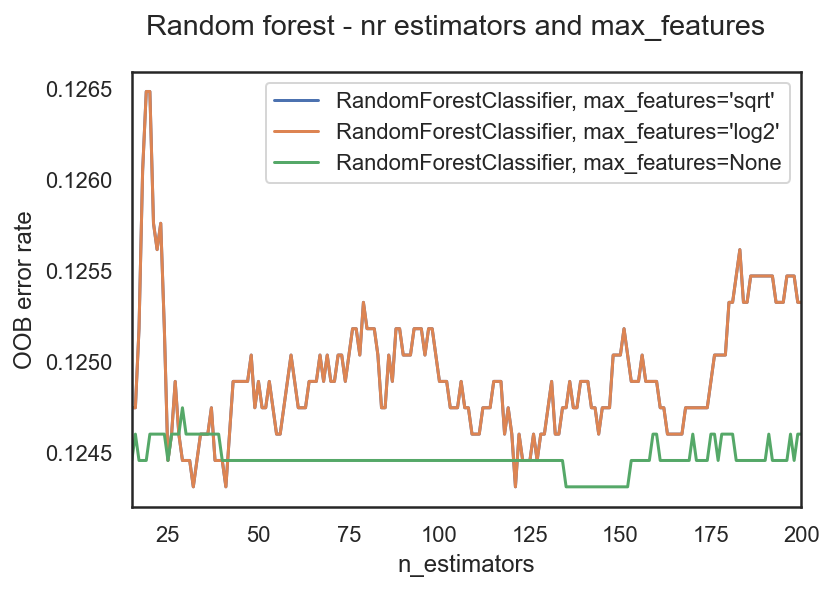

In [262]:
# # adapted from https://scikit-learn.org/stable/auto_examples/ensemble/plot_ensemble_oob.html 

# RANDOM_STATE = 42

# ensemble_clfs = [
#     (
#         "RandomForestClassifier, max_features='sqrt'",
#         RandomForestClassifier(
#             warm_start=True,
#             oob_score=True,
#             max_features="sqrt",
#             random_state=RANDOM_STATE,
#             min_samples_leaf=500,
#             class_weight='balanced_subsample',
#             max_samples=0.6
#         ),
#     ),
#     (
#         "RandomForestClassifier, max_features='log2'",
#         RandomForestClassifier(
#             warm_start=True,
#             max_features="log2",
#             oob_score=True,
#             random_state=RANDOM_STATE,
#             min_samples_leaf=500,
#             class_weight='balanced_subsample',
#             max_samples=0.6
#         ),
#     ),
#     (
#         "RandomForestClassifier, max_features=None",
#         RandomForestClassifier(
#             warm_start=True,
#             max_features=None,
#             oob_score=True,
#             random_state=RANDOM_STATE,
#             min_samples_leaf=500,
#             class_weight='balanced_subsample',
#             max_samples=0.6
            
#         ),
#     ),
# ]

# error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# min_estimators = 15
# max_estimators = 200

# for label, clf in ensemble_clfs:
#     for i in range(min_estimators, max_estimators + 1):
#         clf.set_params(n_estimators=i)
#         clf.fit(X_train_eng[sets_RF1], y_train_df)
        
#         oob_error = 1 - clf.oob_score_
#         error_rate[label].append((i, oob_error))


# for label, clf_err in error_rate.items():
#     xs, ys = zip(*clf_err)
#     plt.plot(xs, ys, label=label)

# plt.xlim(min_estimators, max_estimators)
# plt.xlabel("n_estimators")
# plt.ylabel("OOB error rate")
# plt.legend(loc="upper right")
# plt.suptitle("Random forest - nr estimators and max_features")
# plt.show()

In [263]:
# def return_f1score(model, X, y):
#     cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats = 3, random_state = 1)
#     n_scores = cross_val_score(model, X, y, scoring = make_scorer(f1_score), cv = cv)
#     return n_scores
# def return_results(models):
#     results, names = [],[]
#     for name, model in models.items():
#         scores = return_f1score(model, X_train_eng[sets_RF1], y_train_df)
#         results.append(scores)
#         names.append(name)
#         print('>%s %.3f (%.3f)' % (name, scores.mean(), scores.std()))
    
#     plt.figure(figsize=(15,7))
#     plt.boxplot(results, labels = names, showmeans = True)
#     plt.xticks(fontsize=14)
#     plt.show()

>400 0.662 (0.023)
>450 0.662 (0.023)
>500 0.662 (0.023)
>550 0.662 (0.023)
>600 0.662 (0.023)


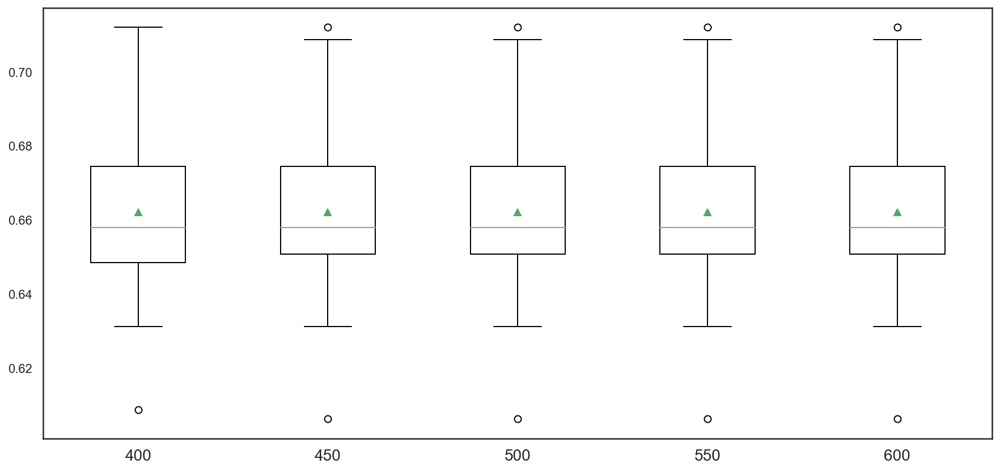

In [264]:
# def get_models(values):
#     models = dict()
#     for value in values:
#         models[str(value)] = RandomForestClassifier(min_samples_leaf = value, n_estimators=20,class_weight='balanced_subsample',criterion="gini", max_features=None,random_state=42)      
#     return models

# models = get_models([400,450,500,550,600])
# return_results(models)

>0.2 0.356 (0.019)
>0.4 0.365 (0.022)
>0.6 0.662 (0.022)
>0.8 0.662 (0.023)
>0.85 0.662 (0.023)
>0.9 0.662 (0.023)
>0.95 0.662 (0.023)
>None 0.662 (0.023)


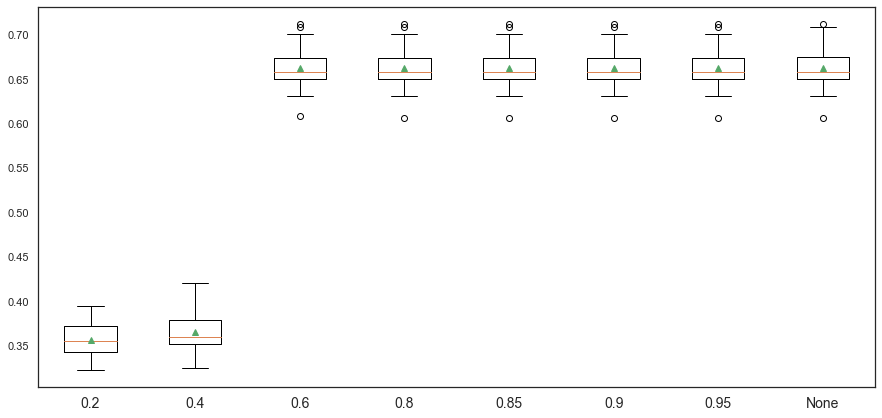

In [ ]:

# def get_models(values):
#     models = dict()
#     for value in values:
#         models[str(value)] = RandomForestClassifier(max_samples = value, n_estimators=20,class_weight='balanced_subsample',criterion="gini", max_features=None, min_samples_leaf=500,random_state=42)      
#     return models

# models = get_models([0.2,0.4,0.6,0.8,0.85,0.90,0.95,None])
# return_results(models)

In [265]:
# clf=RandomForestClassifier(n_estimators=20,class_weight='balanced_subsample',criterion="gini",  max_samples=0.6,max_features=None, min_samples_leaf=500,random_state=42).fit(X_train_eng[sets_RF1], y_train_df)
# model_RF=RandomForestClassifier(n_estimators=20,class_weight='balanced_subsample',criterion="gini",  max_samples=0.6,max_features=None, min_samples_leaf=500,random_state=42)

In [190]:
# metrics1(y_train_df, clf.predict(X_train_eng[sets_RF1]) , y_val_df, clf.predict(X_val_eng[sets_RF1]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5849
           1       0.57      0.80      0.66      1053

    accuracy                           0.88      6902
   macro avg       0.76      0.85      0.79      6902
weighted avg       0.90      0.88      0.88      6902

Confusion Matrix:
[[5200  649]
 [ 207  846]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6640502354788068, 0.6550218340611355)

In [217]:
# #k-fold
# f1_RF=evaluate_model(model_RF, X_train_eng[sets_RF1], y_train_df)

F1 score: 0.662 (0.022)


#### Random forests for outliers

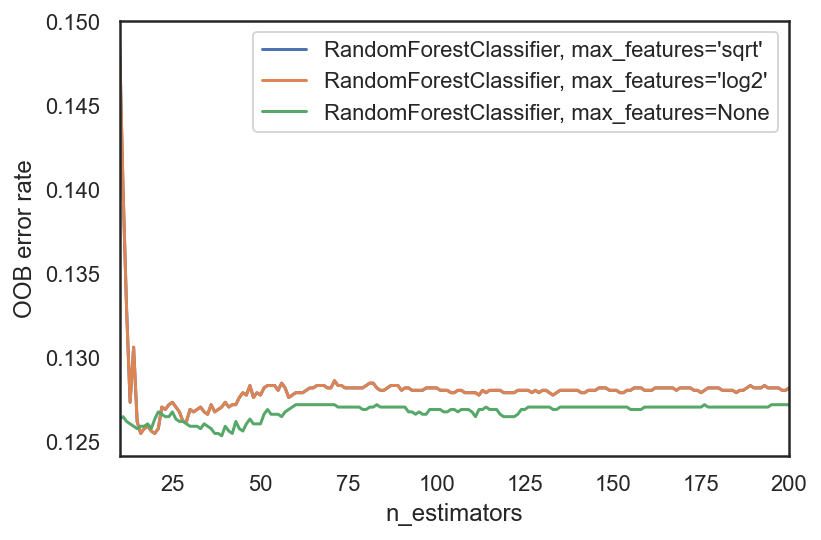

In [129]:

# # adapted from https://scikit-learn.org/stable/auto_examples/ensemble/plot_ensemble_oob.html 

# RANDOM_STATE = 42

# ensemble_clfs = [
#     (
#         "RandomForestClassifier, max_features='sqrt'",
#         RandomForestClassifier(
#             warm_start=True,
#             oob_score=True,
#             max_features="sqrt",
#             random_state=RANDOM_STATE,
#             min_samples_leaf=500,
#             class_weight='balanced_subsample',
#             max_samples=0.6
#         ),
#     ),
#     (
#         "RandomForestClassifier, max_features='log2'",
#         RandomForestClassifier(
#             warm_start=True,
#             max_features="log2",
#             oob_score=True,
#             random_state=RANDOM_STATE,
#             min_samples_leaf=500,
#             class_weight='balanced_subsample',
#             max_samples=0.6
#         ),
#     ),
#     (
#         "RandomForestClassifier, max_features=None",
#         RandomForestClassifier(
#             warm_start=True,
#             max_features=None,
#             oob_score=True,
#             random_state=RANDOM_STATE,
#             min_samples_leaf=500,
#             class_weight='balanced_subsample',
#             max_samples=0.6
            
#         ),
#     ),
# ]
# error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# min_estimators = 10
# max_estimators = 200

# for label, clf in ensemble_clfs:
#     for i in range(min_estimators, max_estimators + 1):
#         clf.set_params(n_estimators=i)
#         clf.fit(X_train_out_robust[sets_RF1], y_train_out)
        
#         oob_error = 1 - clf.oob_score_
#         error_rate[label].append((i, oob_error))


# for label, clf_err in error_rate.items():
#     xs, ys = zip(*clf_err)
#     plt.plot(xs, ys, label=label)

# plt.xlim(min_estimators, max_estimators)
# plt.xlabel("n_estimators")
# plt.ylabel("OOB error rate")
# plt.legend(loc="upper right")
# plt.show()

In [178]:
# model_RF_out=RandomForestClassifier(n_estimators=20,class_weight='balanced_subsample',criterion="gini",  max_samples=0.6,max_features=None, min_samples_leaf=500,random_state=42).fit(X_train_out_robust[sets_RF1], y_train_out)

In [139]:
# metrics1(y_train_out, model_RF_out.predict(X_train_out_robust[sets_RF1]) , y_val_out, model_RF_out.predict(X_val_out_robust[sets_RF1]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5913
           1       0.57      0.80      0.66      1086

    accuracy                           0.87      6999
   macro avg       0.76      0.85      0.79      6999
weighted avg       0.90      0.87      0.88      6999

Confusion Matrix:
[[5242  671]
 [ 213  873]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6638783269961978, 0.652668416447944)

In [140]:
# #k-fold
# f1_RF=evaluate_model(RandomForestClassifier(n_estimators=20,class_weight='balanced_subsample',criterion="gini",  max_samples=0.6,max_features=None, min_samples_leaf=500,random_state=42), X_train_out_robust[sets_RF1], y_train_out)

F1 score: 0.665 (0.024)


<hr>
<a class="anchor" id="Adaboost">
    
### Adaboost 
    
</a>

In [141]:
# cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats = 3, random_state = 1)
# def return_f1score(model, X, y):
#     n_scores = cross_val_score(model, X, y, scoring = 'f1', cv = cv)
#     return n_scores

In [123]:
# def return_results(models):
#     results, names = [],[]
#     for name, model in models.items():
#         scores = return_f1score(model, X_train_eng[set_new1], y_train_df)
#         results.append(scores)
#         names.append(name)
#         print('>%s %.3f (%.3f)' % (name, scores.mean(), scores.std()))
    
#     plt.figure(figsize=(15,7))
#     plt.boxplot(results, labels = names, showmeans = True)
#     plt.xticks(fontsize=14)
#     plt.show()

#### base_estimator: max_depth

>1 0.612 (0.032)
>2 0.591 (0.043)
>3 0.575 (0.035)
>4 0.555 (0.046)
>5 0.533 (0.039)
>6 0.541 (0.042)
>7 0.562 (0.033)
>8 0.566 (0.042)
>9 0.569 (0.035)
>10 0.574 (0.035)
>11 0.578 (0.046)
>12 0.579 (0.038)


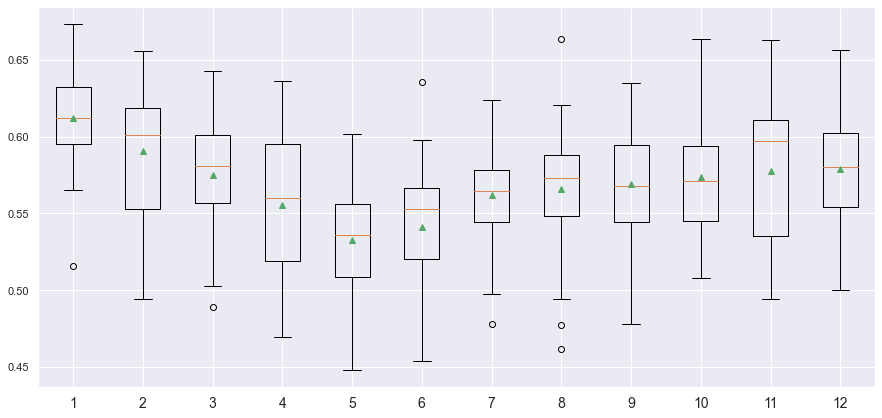

In [180]:
# def get_models(values):
#     models = dict()
#     for value in values:
#         models[str(value)] = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth=value), random_state = 15)      
#     return models

# models = get_models([1,2,3,4,5,6,7,8,9,10,11,12])
# return_results(models)

#### base_estimator: changing the algorithm

>ad_LR 0.417 (0.054)
>ad_def 0.612 (0.032)


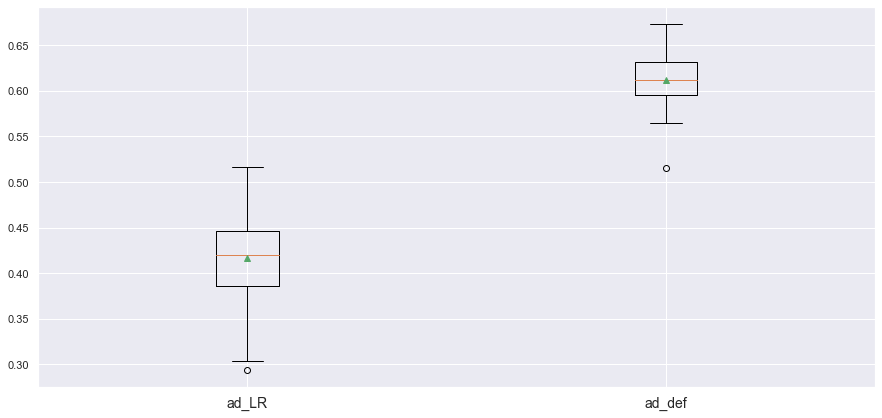

In [181]:
# def get_models():
#     models = dict()
#     models['ad_LR'] = AdaBoostClassifier(base_estimator = LogisticRegression(max_iter=500), random_state = 15)  
#     models['ad_def'] = AdaBoostClassifier(random_state = 15)  
#     return models

# models = get_models()
# return_results(models)

#### Learning Rate

>0.1 0.613 (0.039)
>0.2 0.613 (0.037)
>0.3 0.616 (0.034)
>0.4 0.622 (0.032)
>0.5 0.627 (0.038)
>0.6 0.625 (0.035)
>0.7 0.624 (0.036)
>0.8 0.609 (0.035)
>0.9 0.622 (0.037)
>1.0 0.612 (0.032)


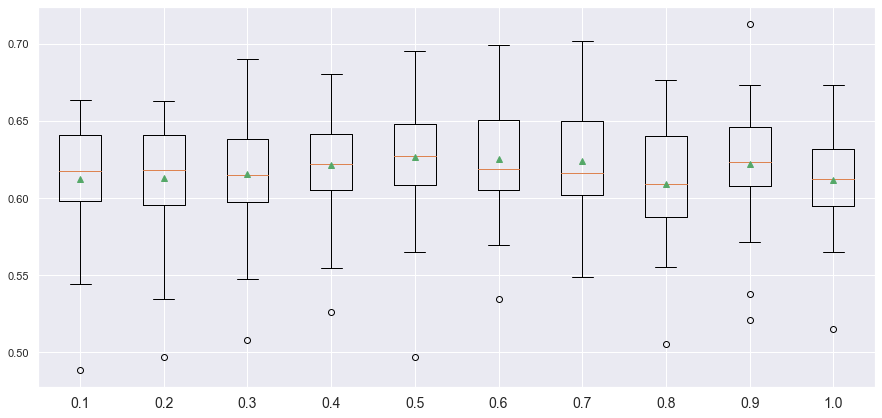

In [182]:
# def get_models(values):
#     models = dict()
#     for value in values:
#         models[str(value)] = AdaBoostClassifier(learning_rate = value, random_state = 15)      
#     return models

# models = get_models([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
# return_results(models)

Testing the learning rate again but with a different number of estimators

>0.1 0.643 (0.037)
>0.2 0.614 (0.043)
>0.3 0.613 (0.035)
>0.4 0.616 (0.034)
>0.5 0.636 (0.040)
>0.6 0.636 (0.034)
>0.7 0.630 (0.036)
>0.8 0.606 (0.025)
>0.9 0.622 (0.040)
>1.0 0.611 (0.036)


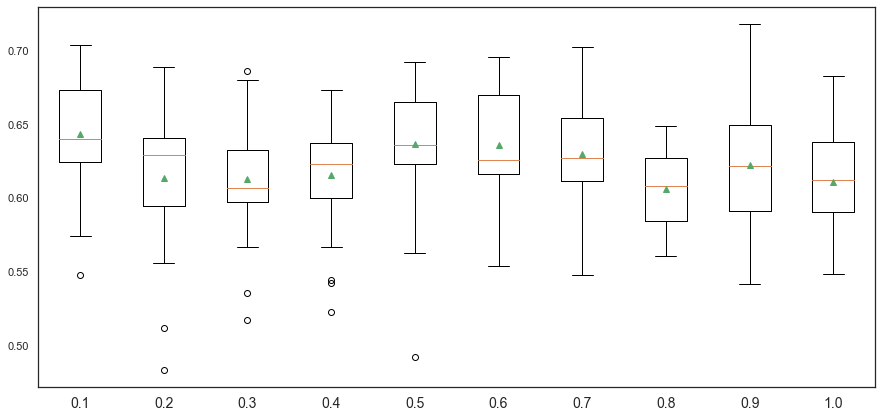

In [124]:
# def get_models(values):
#     models = dict()
#     for value in values:
#         models[str(value)] = AdaBoostClassifier(learning_rate = value, n_estimators = 20, random_state = 15)      
#     return models

# models = get_models([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
# return_results(models)

#### Number of estimators

>10 0.624 (0.032)
>20 0.611 (0.036)
>30 0.616 (0.031)
>50 0.612 (0.032)


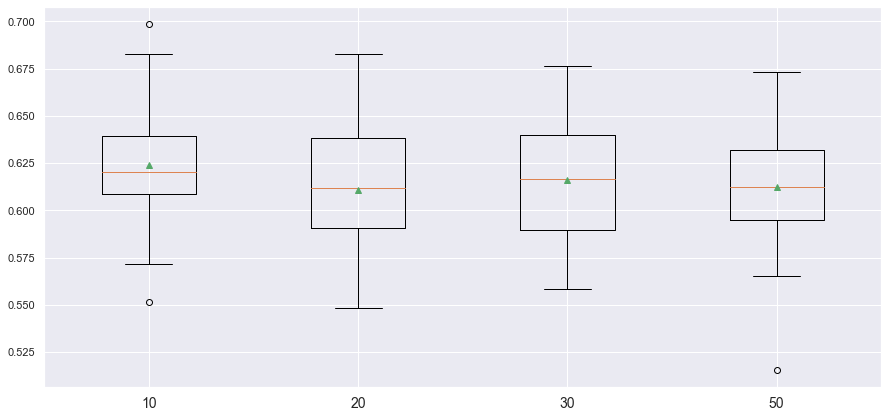

In [185]:
# def get_models(values):
#     models = dict()
#     for value in values:
#         models[str(value)] = AdaBoostClassifier(n_estimators = value, random_state = 15)      
#     return models

# models = get_models([10, 20, 30, 50])
# return_results(models)


#### Algorithm

>SAMME 0.628 (0.033)
>SAMME.R 0.612 (0.032)


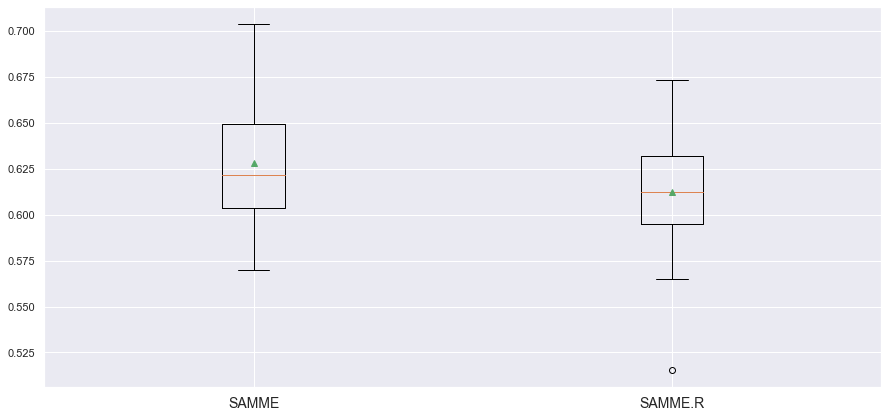

In [186]:
# def get_models(values):
#     models = dict()
#     for value in values:
#         models[str(value)] = AdaBoostClassifier(algorithm = value, random_state = 15)      
#     return models

# models = get_models(["SAMME","SAMME.R"])
# return_results(models)

### Gridsearch

In [190]:
# model = AdaBoostClassifier(algorithm='SAMME', random_state = 42)
# # define the grid of values to search
# grid = dict()
# grid['n_estimators'] = [5, 7, 9, 10, 12]
# grid['learning_rate'] = [0.2,0.3,0.35,0.4,0.5, 0.55, 0.6, 0.65]
# grid['base_estimator'] = [DecisionTreeClassifier(max_depth = 1, class_weight='balanced'), LogisticRegression(class_weight='balanced')]
# # define the evaluation procedure
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# # define the grid search procedure
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=make_scorer(f1_score, average='binary'))
# # execute the grid search
# grid_result = grid_search.fit(X_train_eng[set_new1], y_train_df)
# # summarize the best score and configuration
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# print('----------------------------------------')
# # summarize all scores that were evaluated
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.665468 using {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.3, 'n_estimators': 5}
----------------------------------------
0.664316 (0.029730) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 5}
0.664316 (0.029730) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 7}
0.664316 (0.029730) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 9}
0.664316 (0.029730) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 10}
0.664316 (0.029730) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 12}
0.665468 (0.029570) with: {'base_estimator': DecisionTreeClassifier(class_

In [266]:
# model_AB_clean = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(class_weight='balanced', max_depth=1), learning_rate = 0.3, algorithm = 'SAMME', n_estimators = 5, random_state = 15)
# adaboost_try_gs = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(class_weight='balanced', max_depth=1), learning_rate = 0.3, algorithm = 'SAMME', n_estimators = 5, random_state = 15).fit(X_train_eng[set_new1], y_train_df)

# predict_train_adaboost = adaboost_try_gs.predict(X_train_eng[set_new1])
# predict_val_adaboost = adaboost_try_gs.predict(X_val_eng[set_new1])

# metrics1(y_train_df, predict_train_adaboost , y_val_df, predict_val_adaboost)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.93      5849
           1       0.57      0.80      0.67      1053

    accuracy                           0.88      6902
   macro avg       0.77      0.84      0.80      6902
weighted avg       0.90      0.88      0.89      6902

Confusion Matrix:
[[5228  621]
 [ 215  838]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6671974522292994, 0.6519823788546255)

In [143]:
# evaluate_model(adaboost_try_gs,X_train_eng[set_new1],y_train_df)

F1 score: 0.665 (0.022)


0.6650265096753821

#### Repeating with outliers

In [129]:
# model = AdaBoostClassifier(algorithm='SAMME', random_state = 42)
# # define the grid of values to search
# grid = dict()
# grid['n_estimators'] = [5, 7, 9, 10, 12]
# grid['learning_rate'] = [0.2,0.3,0.35,0.4,0.5, 0.55, 0.6, 0.65]
# grid['base_estimator'] = [DecisionTreeClassifier(max_depth = 1, class_weight='balanced'), LogisticRegression(class_weight='balanced')]
# # define the evaluation procedure
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# # define the grid search procedure
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=make_scorer(f1_score, average='binary'))
# # execute the grid search
# grid_result = grid_search.fit(X_train_out_robust[set_new1], y_train_out)
# # summarize the best score and configuration
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# print('----------------------------------------')
# # summarize all scores that were evaluated
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.666809 using {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.35, 'n_estimators': 5}
----------------------------------------
0.666383 (0.031159) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 5}
0.666383 (0.031159) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 7}
0.666383 (0.031159) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 9}
0.666383 (0.031159) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 10}
0.666383 (0.031159) with: {'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.2, 'n_estimators': 12}
0.666703 (0.031150) with: {'base_estimator': DecisionTreeClassifier(class

In [267]:
# adaboost_outliers = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(class_weight='balanced', max_depth=1), learning_rate = 0.35, algorithm = 'SAMME', n_estimators = 5, random_state = 15).fit(X_train_out_robust[set_new1], y_train_out)

# predict_train_ab_outliers = adaboost_outliers.predict(X_train_out_robust[set_new1])
# predict_val_ab_outliers = adaboost_outliers.predict(X_val_out_robust[set_new1])

# metrics1(y_train_out, predict_train_ab_outliers , y_val_out, predict_val_ab_outliers)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5913
           1       0.57      0.80      0.67      1086

    accuracy                           0.88      6999
   macro avg       0.77      0.85      0.80      6999
weighted avg       0.90      0.88      0.88      6999

Confusion Matrix:
[[5270  643]
 [ 218  868]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6684636118598383, 0.6519823788546255)

In [221]:
# f1_adaboost_out= evaluate_model(adaboost_outliers, X_train_out_robust[set_new1], y_train_out)

F1 score: 0.667 (0.022)


In [268]:
# model_adaboost_out = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(class_weight='balanced', max_depth=1), learning_rate = 0.35, algorithm = 'SAMME', n_estimators = 5, random_state = 15)


<a class="anchor" id="GB">
    
### Gradient Boosting
    
</a>

In [271]:
# gb_set = set_new1

#### Exploring number of samples

>0.1 0.613 (0.044)
>0.2 0.622 (0.048)
>0.3 0.625 (0.045)
>0.4 0.623 (0.047)
>0.5 0.624 (0.045)
>0.6 0.629 (0.045)
>0.7 0.628 (0.045)
>0.8 0.625 (0.049)
>0.9 0.625 (0.047)
>1.0 0.625 (0.048)


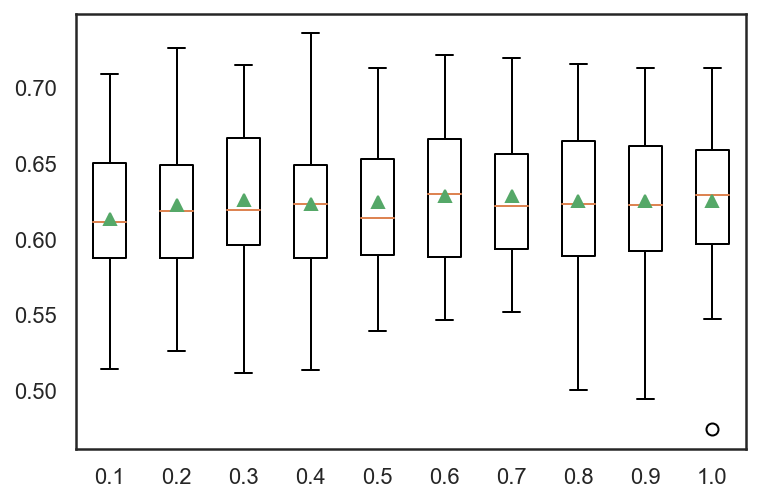

In [276]:
# # get a list of models to evaluate
# def get_models():
# 	models = dict()
# 	# explore sample ratio from 10% to 100% in 10% increments
# 	for i in np.arange(0.1, 1.1, 0.1):
# 		key = '%.1f' % i
# 		models[key] = GradientBoostingClassifier(subsample=i)
# 	return models
 
# # evaluate a given model using cross-validation
# def evaluate_model_GB(model, X, y):
# 	# define the evaluation procedure
# 	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=42)
# 	# evaluate the model and collect the results
# 	scores = cross_val_score(model, X, y, scoring=make_scorer(f1_score, average='binary'), cv=cv, n_jobs=-1)
# 	return scores
 
# # get the models to evaluate
# models = get_models()
# # evaluate the models and store results
# results, names = list(), list()
# for name, model in models.items():
# 	# evaluate the model
# 	scores = evaluate_model_GB(model, X_train_eng[gb_set], y_train_df)
# 	# store the results
# 	results.append(scores)
# 	names.append(name)
# 	# summarize the performance along the way
# 	print('>%s %.3f (%.3f)' % (name, np.mean(scores), np.std(scores)))
# # plot model performance for comparison
# pyplot.boxplot(results, labels=names, showmeans=True)
# pyplot.show()


#### Exploring number of features


1 0.6239 0.0438
2 0.6336 0.0445
3 0.6314 0.0473
4 0.6324 0.0464
5 0.6313 0.0455
6 0.6298 0.0465
7 0.6301 0.0451


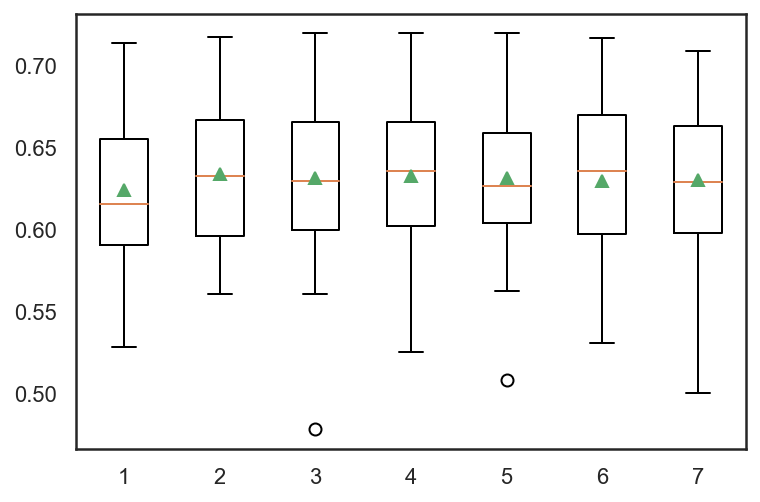

In [275]:
# def get_models(X_data):
#     models = dict()
#     for i in np.arange(1,len(X_data.columns),1):
#         models[str(i)] = GradientBoostingClassifier(max_features=i)
#     return models

# def evaluator(model, X, y):
#     cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats= 5, random_state=42)
#     scores = cross_val_score(model,X,y, scoring = make_scorer(f1_score, average='binary'), cv = cv, n_jobs = -1)
#     return scores

# models = get_models(X_train_eng[gb_set])

# results, names = list(), list()

# for name, model in models.items():
#     scores = evaluator(model, X_train_eng[gb_set], y_train_df)
#     results.append(scores)
#     names.append(name)

#     print(f"{name} {round(mean(scores),4)} {round(std(scores),4)}")

# pyplot.boxplot(results, labels=names, showmeans=True)
# pyplot.show()


#### Exploring Learning Rate


>0.0001 0.000 (0.000)
>0.0010 0.000 (0.000)
>0.0100 0.468 (0.057)
>0.1000 0.625 (0.043)
>1.0000 0.571 (0.044)


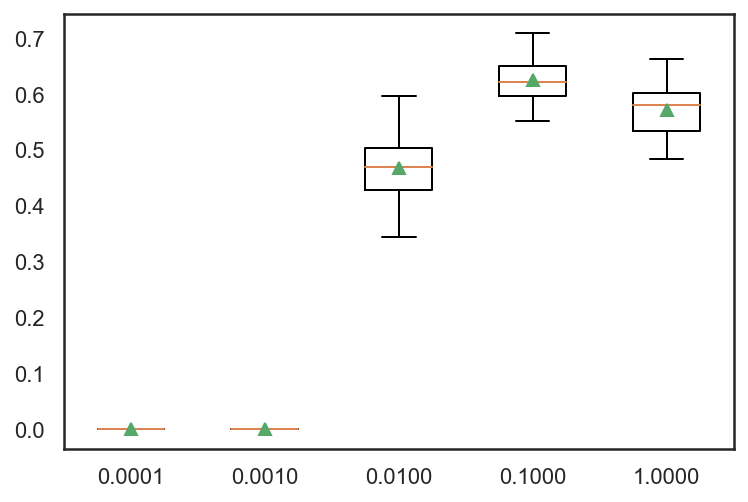

In [277]:
# def get_models():
# 	models = dict()
# 	# define learning rates to explore
# 	for i in [0.0001, 0.001, 0.01, 0.1, 1.0]:
# 		key = '%.4f' % i
# 		models[key] = GradientBoostingClassifier(learning_rate=i)
# 	return models

# def evaluate_modelGB(model, X, y):
# 	# define the evaluation procedure
# 	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# 	# evaluate the model and collect the results
# 	scores = cross_val_score(model, X_train_eng[gb_set], y_train_df, scoring=make_scorer(f1_score, average='binary'), cv=cv, n_jobs=-1)
# 	return scores

# # get the models to evaluate
# models = get_models()
# # evaluate the models and store results
# results, names = list(), list()
# for name, model in models.items():
# 	# evaluate the model
# 	scores = evaluate_modelGB(model, X_train_eng[gb_set], y_train_df)
# 	# store the results
# 	results.append(scores)
# 	names.append(name)
# 	# summarize the performance along the way
# 	print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# # plot model performance for comparison
# pyplot.boxplot(results, labels=names, showmeans=True)
# pyplot.show()

#### Exploring Max Depth of Trees

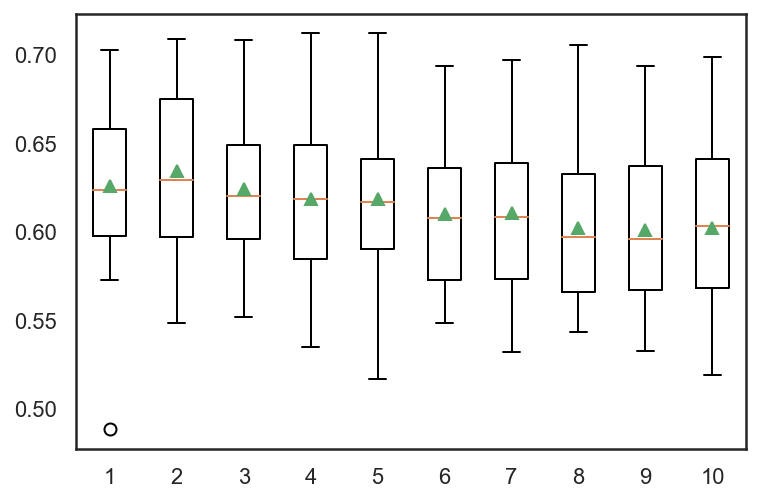

In [278]:
# def get_models():
# 	models = dict()
# 	# define max tree depths to explore between 1 and 10
# 	for i in range(1,11):
# 		models[str(i)] = GradientBoostingClassifier(max_depth=i)
# 	return models
 
# # evaluate a given model using cross-validation
# def evaluate_modelGB(model, X, y):
# 	# define the evaluation procedure
# 	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# 	# evaluate the model and collect the results
# 	scores = cross_val_score(model, X_train_eng[gb_set], y_train_df, scoring=make_scorer(f1_score, average='binary'), cv=cv, n_jobs=-1)
# 	return scores
 
# # get the models to evaluate
# models = get_models()
# # evaluate the models and store results
# results, names = list(), list()
# for name, model in models.items():
# 	# evaluate the model
# 	scores = evaluate_modelGB(model, X_train_eng[gb_set], y_train_df)
# 	# store the results
# 	results.append(scores)
# 	names.append(name)
# 	# summarize the performance along the way
# 	#print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# # plot model performance for comparison
# pyplot.boxplot(results, labels=names, showmeans=True)
# pyplot.show()

#### GridSearch No Outliers, Non-Oversampled

In [279]:
# from sklearn.ensemble import GradientBoostingClassifier
# model = GradientBoostingClassifier()
# # define the grid of values to search
# grid = dict()
# grid['n_estimators'] = [50, 100,200, 500, 750]
# grid['learning_rate'] = [0.001, 0.01, 0.1,0.2,0.25,0.3]
# grid['subsample'] = [0.4,0.5,0.6, 0.7,0.8, 1.0]
# grid['max_depth'] = [1, 3, 5]
# # define the evaluation procedure
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# # define the grid search procedure
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=make_scorer(f1_score, average='binary'))
# # execute the grid search
# grid_result = grid_search.fit(X_train_eng[gb_set], y_train_df)
# # summarize the best score and configuration
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# # summarize all scores that were evaluated
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.634777 using {'learning_rate': 0.2, 'max_depth': 1, 'n_estimators': 200, 'subsample': 0.7}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 50, 'subsample': 0.4}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 50, 'subsample': 0.5}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 50, 'subsample': 0.6}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 50, 'subsample': 0.7}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 50, 'subsample': 0.8}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 50, 'subsample': 1.0}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 100, 'subsample': 0.4}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 100, 'subsample': 0.5}
0.000000 (0.000000) with: {'learning_rate': 0.001, 'max_dep

#### Fitting and Scoring

In [280]:
# #Initialising model with optimised parameters

# gradientbooster = GradientBoostingClassifier(learning_rate=0.3,max_depth=1,n_estimators=50,subsample=0.5)

# #Fitting model
# gradientbooster.fit(X_train_eng[gb_set],y_train_df)

# #print(mean(score), std(score))
# predict_train_gradient_boost = gradientbooster.predict(X_train_eng[gb_set])
# predict_val_gradient_boost = gradientbooster.predict(X_val_eng[gb_set])

# metrics1(y_train_df, predict_train_gradient_boost , y_val_df, predict_val_gradient_boost)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      5849
           1       0.68      0.61      0.64      1053

    accuracy                           0.90      6902
   macro avg       0.81      0.78      0.79      6902
weighted avg       0.89      0.90      0.89      6902

Confusion Matrix:
[[5550  299]
 [ 414  639]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6418884982420894, 0.6482300884955753)

In [194]:
# evaluate_model(gradientbooster, X_train_eng[gb_set], y_train_df)

F1 score: 0.626 (0.041)


0.6258899238201407

#### Gradient Boost Outliers

In [ ]:
# model = GradientBoostingClassifier()
# # define the grid of values to search
# grid = dict()
# grid['n_estimators'] = [50, 100,200, 500, 750]
# grid['learning_rate'] = [0.001, 0.01, 0.1,0.2,0.25,0.3]
# grid['subsample'] = [0.4,0.5,0.6, 0.7,0.8, 1.0]
# grid['max_depth'] = [1, 3, 5]
# # define the evaluation procedure
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# # define the grid search procedure
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=make_scorer(f1_score, average='binary'))
# # execute the grid search
# grid_result = grid_search.fit(X_train_out_robust[gb_set], y_train_out)
# # summarize the best score and configuration
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# # summarize all scores that were evaluated
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

In [301]:
# #Initialising model with optimised parameters

# gradientbooster_out = GradientBoostingClassifier(learning_rate=0.1,max_depth=1,n_estimators=200,subsample=0.4, random_state = 42)

# #Fitting model
# gradientbooster_out.fit(X_train_out_robust[gb_set],y_train_out)

# predict_train_gradient_boost_out = gradientbooster_out.predict(X_train_out_robust[gb_set])
# predict_val_gradient_boost_out = gradientbooster_out.predict(X_val_out_robust[gb_set])

# metrics1(y_train_out, predict_train_gradient_boost_out , y_val_out, predict_val_gradient_boost_out)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      5913
           1       0.68      0.61      0.65      1086

    accuracy                           0.90      6999
   macro avg       0.81      0.78      0.79      6999
weighted avg       0.89      0.90      0.89      6999

Confusion Matrix:
[[5602  311]
 [ 420  666]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6456616577799321, 0.6629588431590655)

#### Gradient Boost OverSampling

In [ ]:
# model = GradientBoostingClassifier()
# # define the grid of values to search
# grid = dict()
# grid['n_estimators'] = [50, 100,200, 500, 750]
# grid['learning_rate'] = [0.001, 0.01, 0.1,0.2,0.25,0.3]
# grid['subsample'] = [0.4,0.5,0.6, 0.7,0.8, 1.0]
# grid['max_depth'] = [1, 3, 5]
# # define the evaluation procedure
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# # define the grid search procedure
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=make_scorer(f1_score, average='binary'))
# # execute the grid search
# grid_result = grid_search.fit(X_train_over[gb_set], y_train_over)
# # summarize the best score and configuration
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# # summarize all scores that were evaluated
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

#### Fitting and Scoring

In [282]:
# #Initialising model with optimised parameters
# #FILL
# gradientbooster_over = GradientBoostingClassifier(learning_rate=0.1,max_depth=5,n_estimators=750,subsample=0.7)

# #Fitting model
# gradientbooster_over.fit(X_train_over[gb_set],y_train_over)

# predict_train_gradient_boost_over = gradientbooster_over.predict(X_train_over[gb_set])
# predict_val_gradient_boost_over = gradientbooster_over.predict(X_val_eng[gb_set])

# metrics1(y_train_over, predict_train_gradient_boost_over , y_val_df, predict_val_gradient_boost_over)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5849
           1       1.00      0.99      0.99      5849

    accuracy                           0.99     11698
   macro avg       0.99      0.99      0.99     11698
weighted avg       0.99      0.99      0.99     11698

Confusion Matrix:
[[5840    9]
 [  68 5781]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.993384311366956, 0.5996055226824457)

#### Changing Threshold of Best Model

In [283]:
# predict_train_gradient_boost_threshold = (gradientbooster_out.predict_proba(X_train_out_robust[gb_set])[:,1] >= 0.3).astype(int)
# predict_val_gradient_boost_threshold = (gradientbooster_out.predict_proba(X_val_out[gb_set])[:,1] >= 0.3).astype(int)

# metrics1(y_train_out, predict_train_gradient_boost_threshold , y_val_out, predict_val_gradient_boost_threshold)
# f1_GB = evaluate_model(GradientBoostingClassifier(learning_rate=0.1,max_depth=5,n_estimators=500,subsample=0.8) , X_train_over[gb_set], y_train_over)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.91      0.93      5913
           1       0.61      0.78      0.68      1086

    accuracy                           0.89      6999
   macro avg       0.78      0.84      0.81      6999
weighted avg       0.90      0.89      0.89      6999

Confusion Matrix:
[[5374  539]
 [ 243  843]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

In [302]:
# f1_GB=f1_special(gradientbooster_out, X_train_out_robust[gb_set], y_train_out,0.33)

In [284]:
# model_GB_out=gradientbooster_out

In [303]:
# f1_GB

0.6703570440077498

<hr>
<a class="anchor" id="VC">
    
## Voting Classifier
    
</a>

In [285]:
# # from set2 remove binary variables
# # estimators_set3 = [('nn', model_NN), ('ab_clean', model_AB_clean), ('rf', model_RF)]
# # estimators_set3_gb = [('nn', model_NN), ('gb_clean', gradientbooster), ('rf', model_RF)]
# # estimators_best = [("svm", svm), ("ada_out", model_adaboost_out), ("rf", model_RF), ("nn", model_NN)]

# estimators_best1 = [("model_GB_out", model_GB_out), ("model_adaboost_out", model_adaboost_out),("model_RF_out",model_RF_out)]

# model_VC_soft = VotingClassifier(estimators = estimators_best1, voting ='soft') 
# vot_soft1 = model_VC_soft.fit(X_train_out_robust[set_new1], y_train_out) 
# metrics1(y_train_out, vot_soft1.predict(X_train_out_robust[set_new1]) , y_val_out, vot_soft1.predict(X_val_out_robust[set_new1]))

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.92      5913
           1       0.57      0.80      0.67      1086

    accuracy                           0.88      6999
   macro avg       0.77      0.85      0.80      6999
weighted avg       0.90      0.88      0.88      6999

Confusion Matrix:
[[5269  644]
 [ 218  868]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------

(0.6682063125481139, 0.6519823788546255)

In [225]:
# f1_VC_soft=evaluate_model(model_VC_soft, X_train_out_robust[set_new1], y_train_out)

F1 score: 0.667 (0.022)


In [173]:
# labels_VC=model_VC_soft.predict(X_test_robust[set_new1])

<hr>
<a class="anchor" id="Stacking">
    
# Stacking Classifier
    
</a>

In [289]:
# models_set3 = [model_NN, model_AB_clean, model_LR, model_RF]
# models_set3_gb = [model_NN, gradientbooster, model_LR, model_RF]
# models_no_bin = [model_KNN, svm]
# models_outliers = [model_log, model_adaboost_out, svm_out, model_NN_out]
# model_outliers2 = [model_log, gradientbooster_out, svm_out, model_NN_out]
# model_set_large = [model_NN, model_AB_clean, model_LR, model_RF]

# estimators_set3 = [('nn', model_NN), ('ab_clean', model_AB_clean), ('rf', model_RF), ('lr', model_LR)]
# estimators_set3_gb = [('nn', model_NN), ('gb_clean', gradientbooster), ('lr_clean', model_LR), ('rf', model_RF)]
# estimators_set_large = [('nn_large', model_NN), ('ab_clean', model_AB_clean), ('lr', model_LR), ('rf', model_RF)]
# estimators_no_bin = [('knn', model_KNN), ('svm', svm)]
# estimators_outliers = [('lr', model_log), ('ab', model_adaboost_out), ('svm_out', svm_out), ('nn_out', model_NN_out)]
# estimators_outliers2 = [('lr', model_log), ('gb', gradientbooster_out), ('svm_out', svm_out), ('nn_out', model_NN_out)]

# estimators_best1 = [("model_GB_out", model_GB_out), ("model_adaboost_out", model_adaboost_out),("model_RF_out",model_RF_out)]


<hr>
<a class="anchor" id="Final">
    
## Final Model
    
</a>

In [305]:
gb_set = set_new1
gradientbooster_out = GradientBoostingClassifier(learning_rate=0.1,max_depth=1,n_estimators=200,subsample=0.4, random_state = 42)
model_GB_out = gradientbooster_out


model_adaboost_out = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(class_weight='balanced', max_depth=1), learning_rate = 0.35, algorithm = 'SAMME', n_estimators = 5, random_state = 15)

sets_RF1=set(set_new1) |set(set_new2)| set(set1_no_bin)
model_RF_out=RandomForestClassifier(n_estimators=20,class_weight='balanced_subsample',criterion="gini",  max_samples=0.6,max_features=None, min_samples_leaf=500,random_state=42)#.fit(X_train_out_robust[sets_RF1], y_train_out)

estimators_best1 = [("model_GB_out", model_GB_out), ("model_adaboost_out", model_adaboost_out),("model_RF_out",model_RF_out)]

In [306]:
model_stk_out = StackingClassifier(estimators = estimators_best1, final_estimator = LogisticRegression(random_state = 42)).fit(X_train_out_robust[large_set_new], y_train_out)

f1_stk_out=evaluate_model(model_stk_out, X_train_out_robust[large_set_new], y_train_out)
metrics1(y_train_out, model_stk_out.predict(X_train_out_robust[large_set_new]), y_val_out, model_stk_out.predict(X_val_out_robust[large_set_new]))

F1 score: 0.671 (0.029)
___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      5913
           1       0.68      0.65      0.66      1086

    accuracy                           0.90      6999
   macro avg       0.81      0.80      0.80      6999
weighted avg       0.90      0.90      0.90      6999

Confusion Matrix:
[[5581  332]
 [ 380  706]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------

(0.664783427495292, 0.6468716861081656)

In [200]:
# stk2 = StackingClassifier(estimators = estimators_set3, final_estimator = LogisticRegression(random_state = 42)).fit(X_train_eng[large_set_new], y_train_df)

# evaluate_model(stk2, X_train_eng[large_set_new], y_train_df)

F1 score: 0.665 (0.035)
ROC_AUC score:0.9130175245374048


(0.6650180923483443, 0.9130175245374048)

In [293]:
# stk_large = StackingClassifier(estimators = estimators_set_large, final_estimator = LogisticRegression(random_state = 42)).fit(X_train_eng[large_set_new], y_train_df)

# evaluate_model(stk_large, X_train_eng[large_set_new], y_train_df)

F1 score: 0.667 (0.037)


0.6667659822106636

In [187]:
# stk_set3_gb = StackingClassifier(estimators = estimators_set3_gb, final_estimator = LogisticRegression(random_state = 42)).fit(X_train_eng[set3], y_train_df)

# evaluate_model(stk_set3_gb, X_train_eng[set3], y_train_df)


F1 score: 0.658 (0.036)
ROC_AUC score:0.9011565488651729


(0.658404032954737, 0.9011565488651729)

In [188]:
# stk_no_bin = StackingClassifier(estimators = estimators_no_bin, final_estimator = LogisticRegression(random_state = 42)).fit(X_train_eng[set1_no_bin], y_train_df)

# evaluate_model(stk_no_bin, X_train_eng[set1_no_bin], y_train_df)

F1 score: 0.637 (0.042)
ROC_AUC score:0.9001460005258359


(0.6368681312792066, 0.9001460005258359)

In [206]:
# stk_outliers = StackingClassifier(estimators = estimators_outliers, final_estimator = LogisticRegression(random_state = 42)).fit(X_train_out_robust[set1_no_bin], y_train_out)

# evaluate_model(stk_outliers, X_train_out_robust[set1_no_bin], y_train_out)

F1 score: 0.647 (0.034)


0.6471741719735267

In [207]:
# stk_outliers2 = StackingClassifier(estimators = estimators_outliers2, final_estimator = LogisticRegression(random_state = 42)).fit(X_train_out_robust[set1_no_bin], y_train_out)

# evaluate_model(stk_outliers2, X_train_out_robust[set1_no_bin], y_train_out)

F1 score: 0.643 (0.038)


0.6432857873698947

In [325]:
# labels_stacking = model_stk_out.predict(X_test_robust[large_set_new])

# labels_stacking_df = pd.DataFrame(labels_stacking)

# kaggle_stacking = pd.DataFrame(X_test_eng.index)

# kaggle_stacking = pd.concat([kaggle_stacking["Access_ID"], labels_stacking_df[0]],axis=1)
# kaggle_stacking["Buy"] = kaggle_stacking[0]
# kaggle_stacking = kaggle_stacking.drop(columns=[0])

# kaggle_stacking.set_index('Access_ID',inplace=True,drop=True)

# kaggle_stacking.value_counts()

# kaggle_stacking = kaggle_stacking.astype(int)

# file_name = 'Group35_Version101.csv'
  
# # saving the excel
# kaggle_stacking.to_csv(file_name)

<hr>
<a class="anchor" id="Model_comparison">
    
# Model Comparison
    
</a>

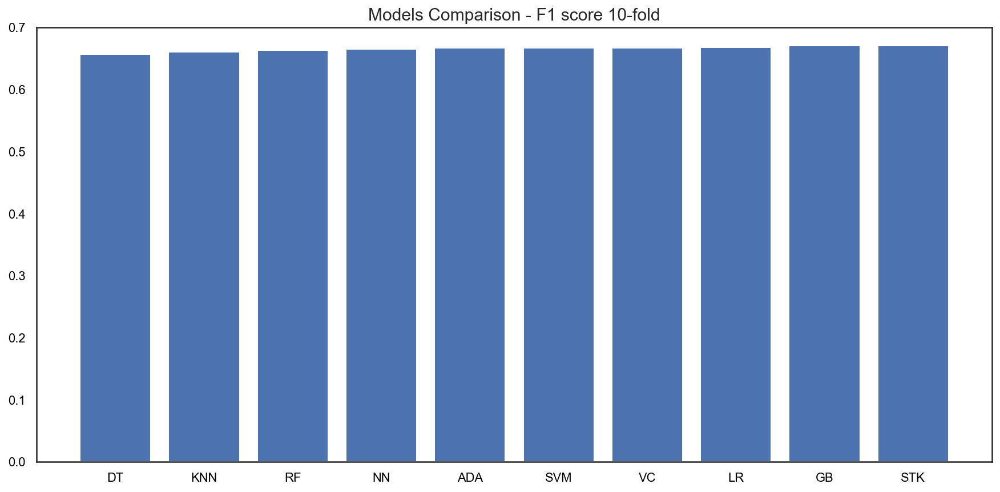

In [226]:
# f1_values = [f1_DT,f1_NN,f1_LR,f1_KNN,f1_SVM_,f1_RF,f1_adaboost_out,f1_GB, f1_VC_soft,f1_stk_out]    
# models = ["DT","NN","LR","KNN","SVM","RF","ADA" ,"GB","VC","STK"]
# data_tuples = list(zip(models, f1_values))
# model_compare = pd.DataFrame(data_tuples)
# model_compare = model_compare.sort_values(1)
# plt.figure(figsize=(15,7))
# plt.bar(model_compare[0], model_compare[1])
# plt.xticks(rotation=0)
# plt.xticks(color='black')
# plt.yticks(color='black')
# plt.ylim(0, 0.7)
# plt.title('Models Comparison - F1 score 10-fold',fontsize=15)
# plt.show()

In [307]:
# result_table = pd.DataFrame(columns=['classifiers', 'recall','precision','auc'])

In [308]:
# def evaluate_model_PR(classifiers, X, y,feat,table):
#     X = X[feat].to_numpy()
    
#     cv = StratifiedKFold(n_splits=10)
   
#     # y=y.to_numpy()
#     # y=y.astype('float')
#     y=np.asarray(y)
#     y=y.astype('float')
  
#     i = 0
#     # evaluate the model and collect the results

#     recall=[]
#     precision=[]
 
#     y_real=[]
#     y_proba=[]
    
#     for classifier in classifiers:
#         recall=[]
#         precision=[]
       
#         y_real=[]
#         y_proba=[]
           
#         # evaluate the model and collect the results
      
#         for i, (train_index, test_index) in enumerate(cv.split(X,y)):
#             Xtrain, Xtest = X[train_index], X[test_index]
#             ytrain, ytest = y[train_index], y[test_index]
#             classifier.fit(Xtrain, ytrain)
#             pred_proba = classifier.predict_proba(Xtest)
            
#             precision, recall, _ = precision_recall_curve(ytest, pred_proba[:,1])
#             y_real.append(ytest)
#             y_proba.append(pred_proba[:,1])

#         y_real = np.concatenate(y_real)
#         y_proba = np.concatenate(y_proba)
#         precision, recall, _ = precision_recall_curve(y_real, y_proba)
#         print(auc(recall, precision))

#         table=table.append({'classifiers':classifier.__class__.__name__,
#                                             'recall':recall, 
#                                             'precision':precision, 
#                                             'auc':auc(recall, precision)}, ignore_index=True)
#     print('ROC_PR score:' + str(auc(recall, precision)))
#     return table

In [309]:
# result_table=evaluate_model_PR([model_DT], X_train_eng, y_train_df,set3,result_table)

0.6449851425102374
ROC_PR score:0.6449851425102374


In [310]:
# result_table=evaluate_model_PR([model_adaboost_out], X_train_out_robust, y_train_out,set_new1,result_table)

0.6969554479579798
ROC_PR score:0.6969554479579798


In [311]:
# result_table=evaluate_model_PR([model_stk_out], X_train_out_robust, y_train_out,large_set_new,result_table)

0.6720316526991742
ROC_PR score:0.6720316526991742


In [312]:
# result_table=evaluate_model_PR([model_NN_out], X_train_out_robust, y_train_out,large_set_new,result_table)

0.6794491983645129
ROC_PR score:0.6794491983645129


In [313]:
# result_table=evaluate_model_PR([model_VC_soft], X_train_out_robust, y_train_out,set_new1,result_table)

0.6773888543488885
ROC_PR score:0.6773888543488885


In [316]:
# result_table=evaluate_model_PR([model_SVM], X_train_eng, y_train_df,set1_no_bin,result_table)

0.6270855163167263
ROC_PR score:0.6270855163167263


In [317]:
# result_table=evaluate_model_PR([model_RF_out], X_train_out_robust, y_train_out,sets_RF1,result_table)

0.53100386911565
ROC_PR score:0.53100386911565


In [318]:
# result_table=evaluate_model_PR([model_LR], X_train_out_robust, y_train_out,set_new2,result_table)

0.6500219034426962
ROC_PR score:0.6500219034426962


In [319]:
# result_table=evaluate_model_PR([model_KNN], X_train_eng, y_train_df,set1_no_bin,result_table)

0.6922293761900781
ROC_PR score:0.6922293761900781


In [320]:
# result_table=evaluate_model_PR([gradientbooster_out], X_train_out_robust, y_train_out,set_new1,result_table)

0.6707641116950127
ROC_PR score:0.6707641116950127


In [322]:
# result_table.iloc[5,0]='SupportVectorClassifier'

In [323]:
# result_table

,classifiers,recall,precision,auc
0,DecisionTreeClassifier,"[1.0, 0.9981006647673314, 0.9971509971509972, ...","[0.15256447406548826, 0.18192833650683746, 0.1...",0.644985
1,AdaBoostClassifier,"[1.0, 0.8057090239410681, 0.8047882136279927, ...","[0.1551650235747964, 0.5641521598968408, 0.564...",0.696955
2,StackingClassifier,"[1.0, 0.9990791896869244, 0.9990791896869244, ...","[0.19911991199119913, 0.19897304236200256, 0.1...",0.672032
3,MLPClassifier,"[1.0, 0.9990791896869244, 0.9990791896869244, ...","[0.15940114487010126, 0.15953536244669902, 0.1...",0.679449
4,VotingClassifier,"[1.0, 0.9990791896869244, 0.9990791896869244, ...","[0.1551650235747964, 0.15604774917301883, 0.15...",0.677389
5,SupportVectorClassifier,"[1.0, 0.9990503323836657, 0.9981006647673314, ...","[0.15298561673688799, 0.15286253995931415, 0.1...",0.627086
6,RandomForestClassifier,"[1.0, 0.9990791896869244, 0.9990791896869244, ...","[0.1551650235747964, 0.15679190751445088, 0.15...",0.531004
7,LogisticRegression,"[1.0, 0.9990791896869244, 0.998158379373849, 0...","[0.1551650235747964, 0.1556671449067432, 0.156...",0.650022
8,KNeighborsClassifier,"[1.0, 0.9715099715099715, 0.9382716049382716, ...","[0.15256447406548826, 0.20285544318857823, 0.2...",0.692229
9,GradientBoostingClassifier,"[1.0, 0.9990791896869244, 0.9990791896869244, ...","[0.15520937544661997, 0.15508862206975416, 0.1...",0.670764


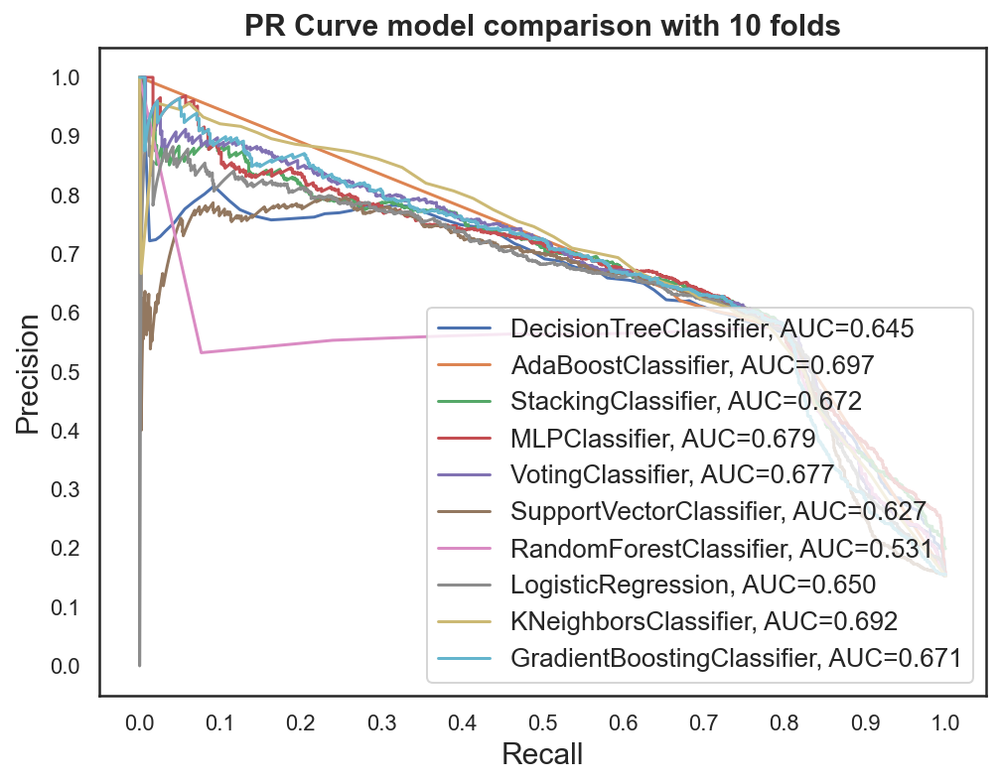

In [324]:
# sns.set_theme(style="white")
# fig = plt.figure(figsize=(8,6))

# for i in range(0,len(result_table)):
#     plt.plot(result_table.iloc[i]['recall'], 
#              result_table.iloc[i]['precision'], 
#              label="{}, AUC={:.3f}".format(result_table['classifiers'][i], result_table.iloc[i]['auc']))
    
# plt.xticks(np.arange(0.0, 1.1, step=0.1))
# plt.xlabel("Recall", fontsize=15)

# plt.yticks(np.arange(0.0, 1.1, step=0.1))
# plt.ylabel("Precision", fontsize=15)

# plt.title('PR Curve model comparison with 10 folds', fontweight='bold', fontsize=15)
# plt.legend(prop={'size':13}, loc='lower right')

# plt.show()

### End of project